<center> 

# Results Notebook

Dawid Rogalski

Wrocław 2023

## Introduction

In this notebook the results obtained using the Main Notebook are processed and visualised. The notebook is divided into four sections:
- Model comparison: here the basic comparison of the models is done, based on their evaluation, performance metrics (precision, recall, F1 score) are calculated and the learning curves are presented
- Influence of image quality: here the first tests of the image quality influence are analysed and presented
- Augmentation: here the comparison of models before and after augmentation with different proportions is done, as well as the results of second image quality influence tests are showed
- Additional visuals: here the additional visuals from the thesis are prepared

### Loading dependencies

In [53]:
# Loading libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pathlib
import tensorflow as tf
import tf_utils as tfu
import albumentations as A
import random

### Setting main parameters

Paramateres and options set here are used throughout the entire notebook.

In [50]:
# Parameters
IMG_SIZE = (224, 224) # Width and height of the images that the model will transform.
FPATH = 'D:/Master thesis/saved_models' # Directory in which models, training history and evaluations are saved
RPATH = 'image quality results' # Directory in which results of image quality influence are saved

# Setting display format for pandas DataFrames
pd.options.display.float_format = '{:.3f}'.format

# Setting parameters for plots
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.5, style='whitegrid')

### Finding and choosing models

The following two cells allow to view all saved models and select the ones we want to test. Run the first cell to display the models stored in `FPATH` directory. Then in the second cell set the `index_list` to a list of indexes from the output of the first cell corresponding to models you want to test. You can also manually set the `selected` variable to a slice or slices of `model_paths` by uncommenting the appropriate line.

In [3]:
# Find paths of the models
model_paths = list(pathlib.Path(FPATH).glob('*'))

# Print the list
print(f"{'No.':<3}\t{'Model':<33}\t{'Test acc.':<10}\t{'Nature acc.':<10}\t{'Seed':<4}") # Header
for i, p in enumerate(model_paths):
    info = tfu.load_json(str(p) + '/info.json') # Load info about the model
    print(f"{i:<3}\t{p.name:<33}\t{info['test_accuracy']:<10.8f}\t{info['nature_accuracy']:<10.8f}\t{info['seed']:<4}") # Line

No.	Model                            	Test acc. 	Nature acc.	Seed
0  	InceptionV3_(2023-04-07)_0       	0.97460938	0.86956525	123 
1  	InceptionV3_(2023-04-08)_0       	0.97916669	0.85507250	2603
2  	InceptionV3_(2023-04-08)_1       	0.97981775	0.84057975	2107
3  	InceptionV3_aug100_(2023-05-10)_1	0.95949537	0.77536231	123 
4  	InceptionV3_aug100_(2023-05-13)_0	0.96414346	0.81159425	2107
5  	InceptionV3_aug100_(2023-05-14)_0	0.96281540	0.84057975	2603
6  	InceptionV3_aug20_(2023-05-11)_0 	0.96613550	0.86956525	123 
7  	InceptionV3_aug20_(2023-05-12)_0 	0.96879154	0.83333337	2107
8  	InceptionV3_aug20_(2023-05-15)_0 	0.96945554	0.83333337	2603
9  	InceptionV3_aug40_(2023-05-11)_2 	0.97742367	0.86956525	123 
10 	InceptionV3_aug40_(2023-05-12)_0 	0.96746349	0.84057975	2107
11 	InceptionV3_aug40_(2023-05-15)_0 	0.97078359	0.89855075	2603
12 	InceptionV3_aug60_(2023-05-11)_0 	0.97410363	0.86956525	123 
13 	InceptionV3_aug60_(2023-05-13)_0 	0.96281540	0.81159425	2107
14 	InceptionV3_aug60_(2

In [4]:
index_list = [41,42,43]

# Selecting based on the index list
selected = []
for i in index_list:
    selected.append(model_paths[i])

# Selecting based on slices
selected = model_paths

# Displaying the paths of the selected models
selected 

[WindowsPath('D:/Master thesis/saved_models/InceptionV3_(2023-04-07)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_(2023-04-08)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_(2023-04-08)_1'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug100_(2023-05-10)_1'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug100_(2023-05-13)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug100_(2023-05-14)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug20_(2023-05-11)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug20_(2023-05-12)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug20_(2023-05-15)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug40_(2023-05-11)_2'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug40_(2023-05-12)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3_aug40_(2023-05-15)_0'),
 WindowsPath('D:/Master thesis/saved_models/InceptionV3

### Loading names of classes

This cell loads names of classes in the same order as they were used in the models (alphabetical).

In [5]:
butterfly_labels = list(map(lambda x: x.name, pathlib.Path('kaggle dataset').glob('*'))) # List of labels
no_classes = len(butterfly_labels) # Number of classes

## Training results and models comparison

### Loading inforamtion of models

This cell loads information and training history of all the selected models from `info.json` and `history.json` files to a single DataFrame.

In [6]:
# List for rows
data = []

# Loop over models
for p in selected:
    info = tfu.load_json(str(p) + '/info.json') # Loading info
    history = tfu.load_json(str(p) + '/history.json') # Loading history
    info['directory'] = p.name # Adding directory name (a unique value for each model)
    info['history'] = history # Adding history as a part of dictionary
    data.append(info) # Full dictionary becomes a single row in DataFrame

# Creating DataFrame
df = pd.DataFrame(data)

# Renaming models for display reasons
df['name'].replace({
    'InceptionV3':'Inception', 
    'MobileNetV2':'MobileNet',
    'ResNet':'ResNet50',
    'ResNet50v2':'ResNet50'},inplace=True)

# Converting accuracies to percentage values
df[['test_accuracy','nature_accuracy']] *= 100

# Proper calculating of epochs (as sometimes training was stopped sooner)
epochs = [len(h['loss']) for h in df['history']]
df['epochs'] = epochs

# Calculating training time per epoch
df['time_per_epoch'] = df['duration'] / df['epochs']

### Comparing the models

This cell produces a DataFrame contatining means and standard deviations of accuracy on the Kaggle DS, accuracy on the Nature DS, inference latency and minimal training time per epoch. It corresponds to Table 4.1. in the thesis.

The `df` DataFrame is first queries for models trained without data augmentation, then grouped by models' names and only four mentioned values are selected. Then corresponding aggregation functions are calculated for the colums.

In [7]:
df[df['augmentation']==0]\
    .groupby('name')\
    [['test_accuracy','nature_accuracy', 'inference_time', 'time_per_epoch']]\
    .agg({
        'test_accuracy':['mean','std'],
        'nature_accuracy':['mean','std'],
        'inference_time':['mean','std'],
        'time_per_epoch':'min'})

test_accuracy       nature_accuracy       inference_time        \
                   mean   std            mean   std           mean   std   
name                                                                       
Inception        97.786 0.284          85.507 1.449          3.941 0.069   
MobileNet        97.852 0.362          87.198 3.991          2.817 0.032   
ResNet50         97.027 0.433          77.778 1.508          5.447 0.091   
VGG16            94.379 0.246          78.019 1.107         10.771 0.023   
VGG19            92.361 0.874          72.464 3.159         13.735 0.379   

          time_per_epoch  
                     min  
name                      
Inception        108.442  
MobileNet         80.926  
ResNet50         129.494  
VGG16             91.827  
VGG19            117.909

### Averaged training history

This cell produces plots of learning curves for each model, averaged over their instances. A dedicated function `agg_func` for averaging history of training while aggregating grouped DataFrame is coded. The plots correspond to Figure 4.1 in the thesis.

Inception


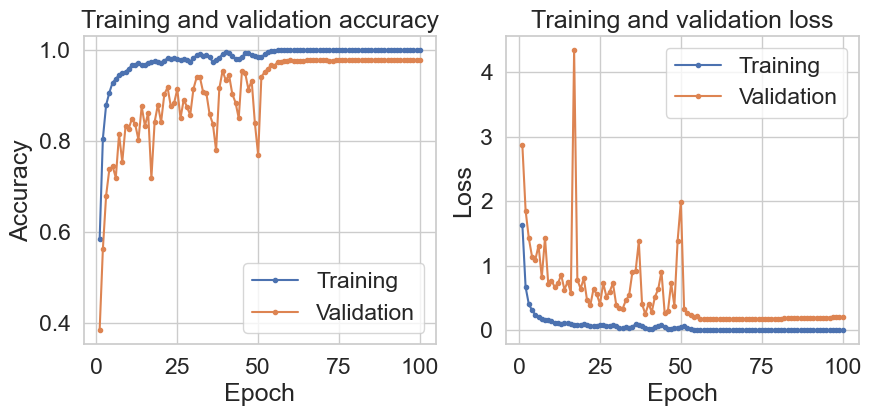

MobileNet


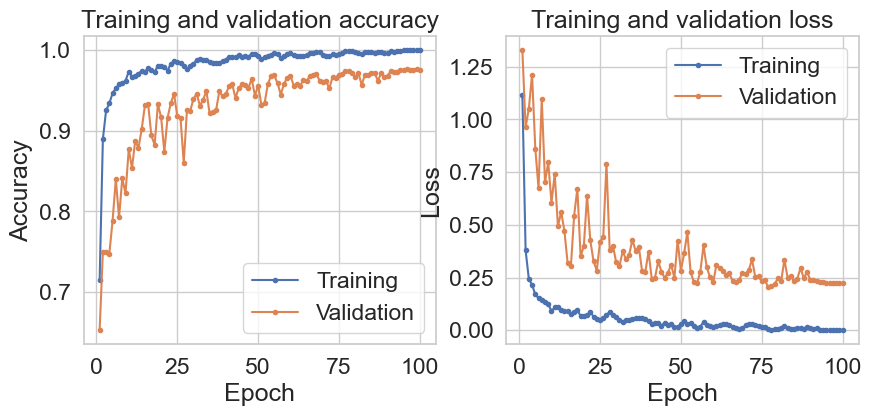

ResNet50


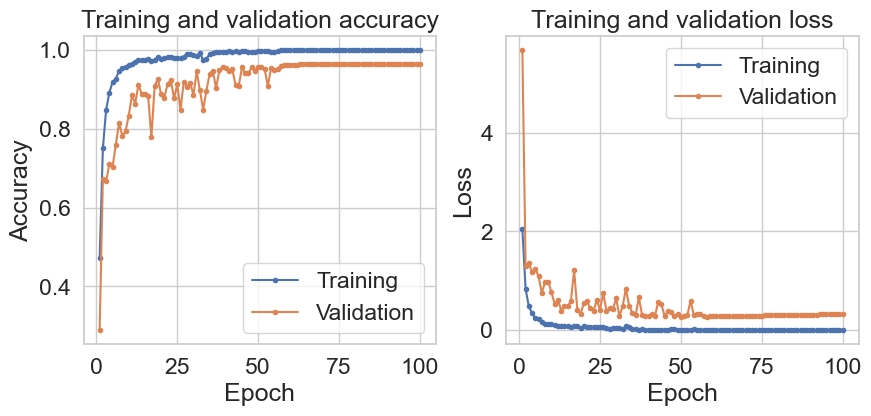

VGG16


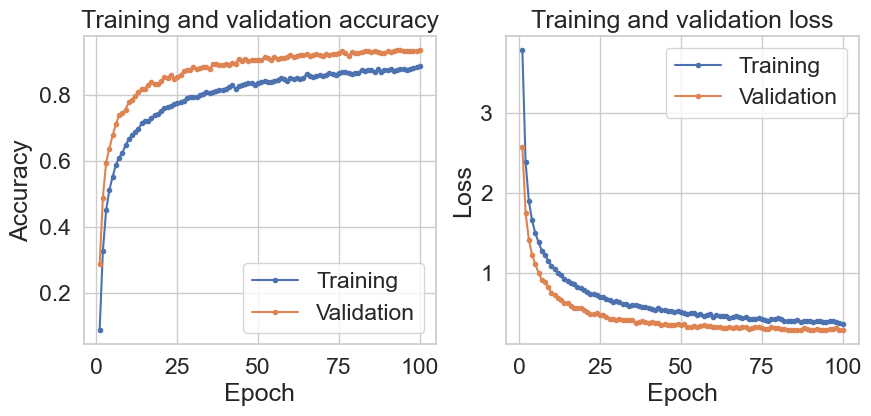

VGG19


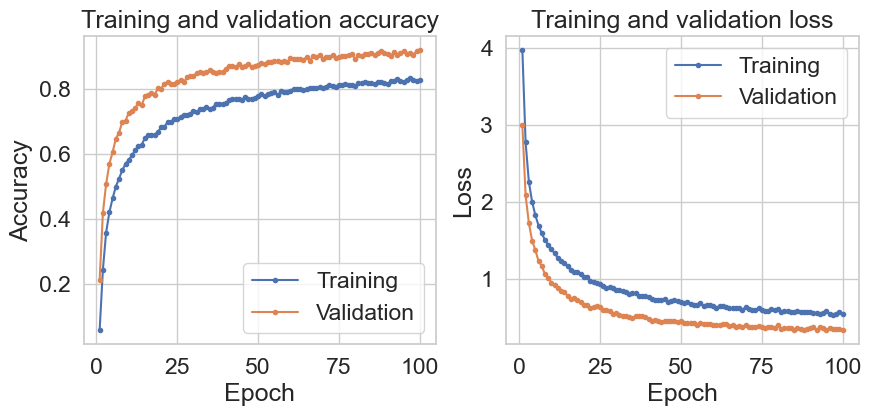

In [8]:
N = df['epochs'].max() # Max number of epochs

# Aggregating function
def agg_func(x):
    M = len(x) # Number of elements in group

    # New history dictionary with initialised arrays
    dic = {
        'loss' : np.zeros(N),
        'accuracy' : np.zeros(N),
        'val_loss' : np.zeros(N),
        'val_accuracy' : np.zeros(N)
    }

    # Loop over elements in group
    for h in x:
        # Loop over curves
        for k in dic.keys():
            # The old curve is padded on the right with the last value of the array and summed with the new curve element-wise
            dic[k] += np.pad(np.array(h[k]), (0, N-len(h[k])), 'edge')

    # We average the values by dividing by the number of elements in group
    for k in dic.keys():
        dic[k] /= M
    
    # And return the new dictionary
    return dic

# Selecting the models trained withoud data augmentation, grouping by names and aggregating with our function
original_history = df[df['augmentation'] == 0].groupby('name')['history'].agg(agg_func)

# For every model, plotting the averaged learning curves
for i, h in original_history.items():
    print(f'{i}') # Model name
    tfu.plot_history(h,figsize=(10,4)) # Plots
    plt.show()

### Precision, recall and F1 score

This cell calculates precision, recall and F1 scores for every model, species and both data sets, averaged over instances of the same model. Only the models trained without data augmentation are considered.

In [9]:
# Dictionary with lists that will form DataFrame columns
data = {'Model': [], 'Species': [], 'Precision': [], 'Recall': [], 'F1': [], 'Dataset': []}

# Loop over the models in global DataFrame queried to contain only models trained without data augmentation
for i, row in df[df['augmentation'] == 0].iterrows():
    # Computing scores on Kaggle DS
    test_precision = tfu.get_precisions(row['test_confusion'])
    test_recall = tfu.get_recalls(row['test_confusion'])
    test_f1 = tfu.f1_score(test_precision, test_recall)
    
    # Computing scores on Nature DS
    nature_precision = tfu.get_precisions(row['nature_confusion'])
    nature_recall = tfu.get_recalls(row['nature_confusion'])
    nature_f1 = tfu.f1_score(nature_precision, nature_recall)

    # Adding values to the lists - from one model, 2*no_classes records come, as there are two data sets
    data['Model'] += [row['name']] * no_classes * 2 # Model names
    data['Species'] += butterfly_labels * 2 # Class labels
    data['Precision'] += list(test_precision) + list(nature_precision) # Precisions
    data['Recall'] += list(test_recall) + list(nature_recall) # Recalls
    data['F1'] += list(test_f1) + list(nature_f1) # F1 scores
    data['Dataset'] += ['Kaggle'] * no_classes + ['Nature'] * no_classes # Data set names

# Creating DataFrame
scores = pd.DataFrame(data)

# Dropping rows from Nature DS with species that it does not include
scores.dropna(inplace=True)

This cell presents mean values of the metrics along with standard deviations for every model, averaged over its instances and species. The output corresponds to Table 4.2 in the thesis.

In [10]:
# Query for records from the Kaggle DS
kaggle_scores = scores[scores['Dataset'] == 'Kaggle']

# Group by model, select precision, recall and F1 score and compute mean and standard deviation
kaggle_scores.groupby('Model')[['Precision', 'Recall', 'F1']].agg(['mean','std'])

Precision       Recall          F1      
               mean   std   mean   std  mean   std
Model                                             
Inception     0.978 0.036  0.977 0.041 0.977 0.032
MobileNet     0.975 0.040  0.973 0.045 0.973 0.034
ResNet50      0.965 0.042  0.963 0.047 0.963 0.034
VGG16         0.938 0.068  0.933 0.078 0.933 0.060
VGG19         0.925 0.084  0.920 0.095 0.919 0.079

This cell generated histograms of average precision, recall and F1 score for every model. It presente how many species, on average, have a given value of the metric for a given model. It corresponds to Figure 4.2 in the thesis.

Inception


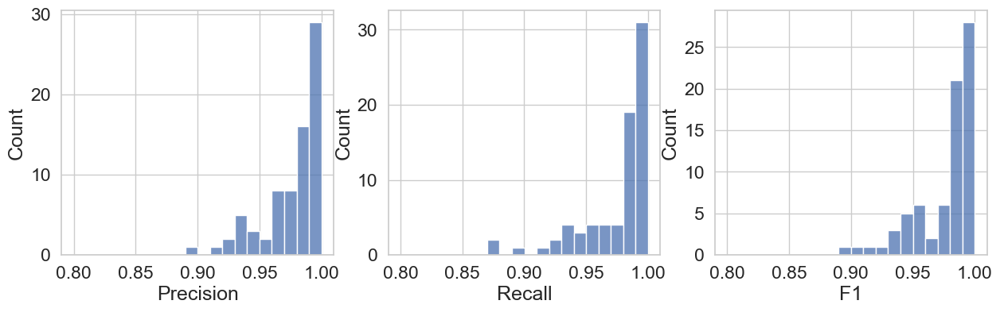

MobileNet


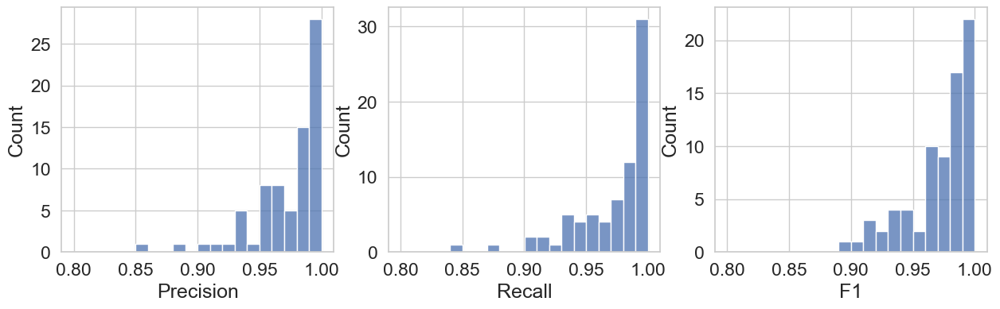

ResNet50


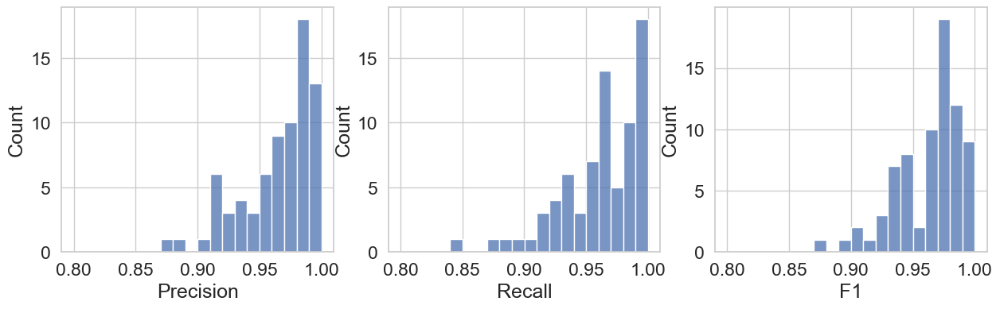

VGG16


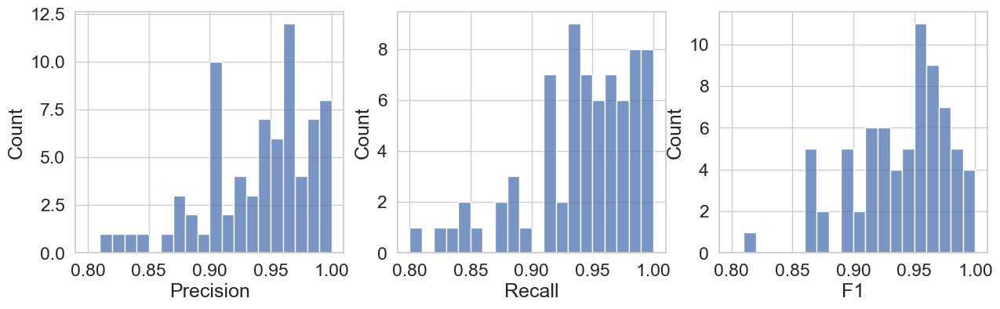

VGG19


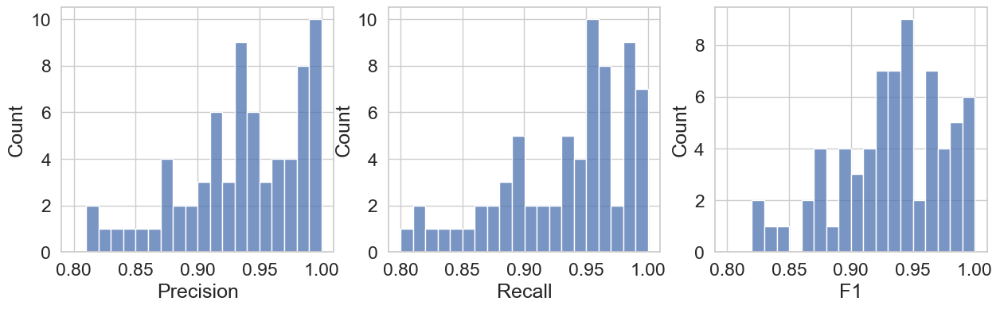

In [11]:
# Parameters of histograms
min_val = 0.8
max_val = 1.0
bin_width = 0.01

# For every model create sub DataFrame with species and their average scores
kaggle_scores_dic = {model: kaggle_scores[kaggle_scores['Model'] == model].pivot_table(values=['Precision', 'Recall', 'F1'], index='Species', aggfunc=np.mean) for model in kaggle_scores['Model'].unique()}

# Loop over models
for k in kaggle_scores_dic.keys():
    # Create a figure
    fig, axes = plt.subplots(1, 3, figsize=(15,4))
    # Loop over metrics
    for i, s in enumerate(['Precision', 'Recall', 'F1']):
        # Plot histograms       
        sns.histplot(kaggle_scores_dic[k], x=s, ax=axes[i], binrange=(min_val, max_val), binwidth=bin_width)
        axes[i].set_xticks([0.8, 0.85, 0.9, 0.95, 1.0])
        
    # Print the model name
    print(k)
    plt.show()


This cell provides insight on the average values of precision and recall score for species in the Nature DS. It corresponds to Table 4.3 in the thesis.

In [12]:
# Query for records from the Nature DS
nature_scores = scores[scores['Dataset']=='Nature']
nature_scores.pivot_table(values=['Precision', 'Recall'], index='Species',columns='Model',aggfunc='mean')

Precision                                   Recall  \
Model                    Inception MobileNet ResNet50 VGG16 VGG19 Inception   
Species                                                                       
aglais io                    1.000     1.000    1.000 1.000 1.000     1.000   
anthocharis cardamines       1.000     1.000    1.000 1.000 1.000     0.524   
carterocephalus palaemon     1.000     1.000    0.972 0.892 1.000     0.989   
favonius quercus             1.000     1.000    1.000 0.605 0.433     0.294   
iphiclides podalirius        1.000     1.000    1.000 1.000 1.000     0.990   
nymphalis antiopa            1.000     0.966    1.000 1.000 1.000     0.833   
pieris rapae                 1.000     0.981    0.855 1.000 0.869     0.967   
satyrium pruni               0.938     0.981    0.981 1.000 1.000     0.897   
vanessa atalanta             1.000     0.974    1.000 0.775 0.908     1.000   
vanessa cardui               1.000     1.000    1.000 1.000 1.000     0.889   

                                                         
Model                    MobileNet ResNet50 VGG16 VGG19  
Species                                                  
aglais io                    0.933    1.000 0.867 0.800  
anthocharis cardamines       0.571    0.524 0.524 0.286  
carterocephalus palaemon     0.946    0.946 0.989 0.892  
favonius quercus             0.471    0.059 0.118 0.059  
iphiclides podalirius        0.981    0.971 0.981 0.990  
nymphalis antiopa            0.778    0.722 0.833 0.667  
pieris rapae                 1.000    0.767 0.967 0.900  
satyrium pruni               0.949    1.000 0.897 0.718  
vanessa atalanta             1.000    1.000 0.833 1.000  
vanessa cardui               0.917    0.639 0.500 0.694

### Misclassifications in Nature DS

This cell loads a single model (in this case it was Inception without augmentation) and the Nature DS.

In [13]:
# Loading the dataset
ds = tf.keras.utils.image_dataset_from_directory(
    'nature dataset',
    validation_split=0,
    shuffle=False,
    image_size=IMG_SIZE,
    batch_size=1
)

# Normalizing images
ds = ds.map(tfu.normalize).cache().prefetch(tf.data.AUTOTUNE)

# Loading the selected model
model = tf.keras.models.load_model(f'{selected[0]}/model')

Found 138 files belonging to 75 classes.


This cell produces the prediction plots with the predicted image, reference images of top three predictions and distribution of probabilitires returned by the model for all images from Nature DS depicting *nymphalis antiopa*, *favonius quercus* and *anthocharis cardamines* butterflies. Four of these plots are in Figure 4.3 in the thesis.

anthocharis cardamines
1/1 [==============================] - 2s 2s/step


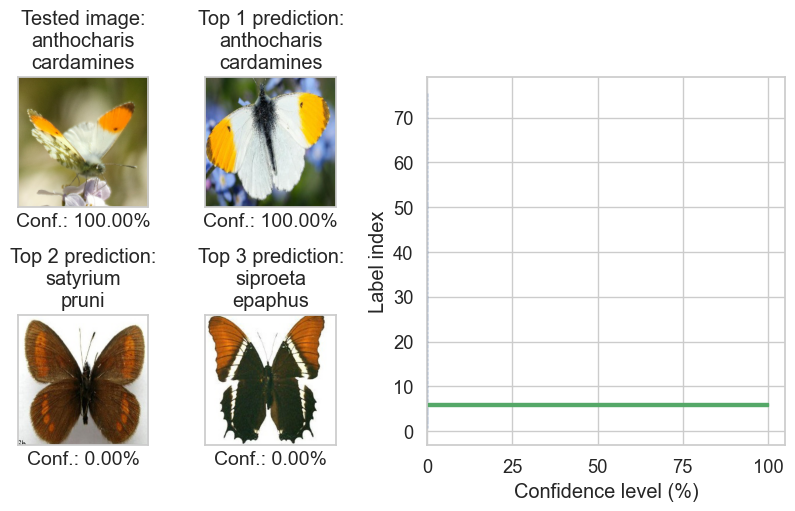

anthocharis cardamines
1/1 [==============================] - 0s 81ms/step


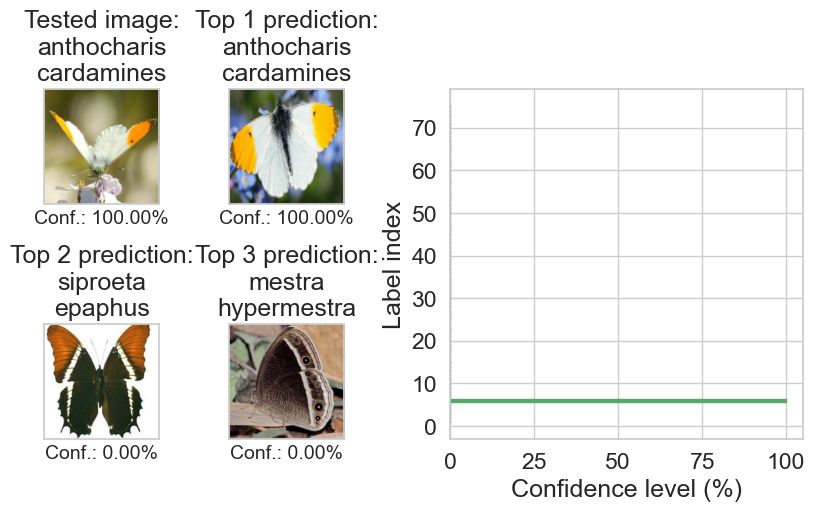

anthocharis cardamines
1/1 [==============================] - 0s 57ms/step


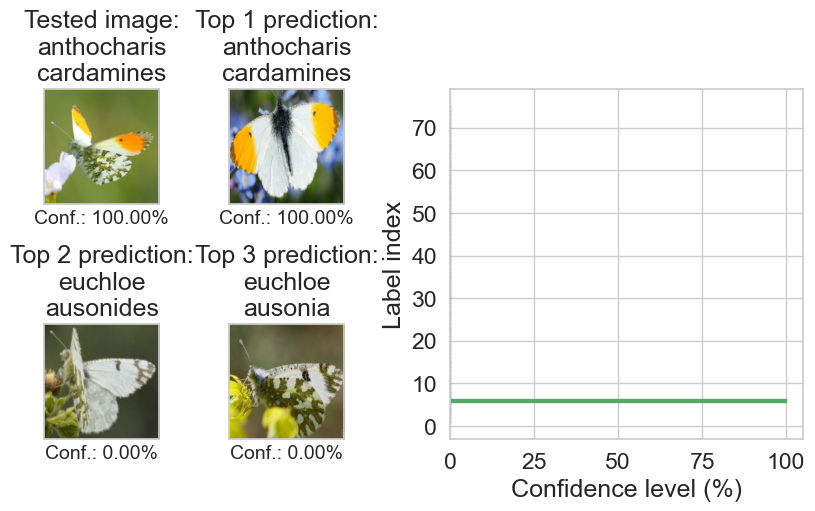

anthocharis cardamines
1/1 [==============================] - 0s 54ms/step


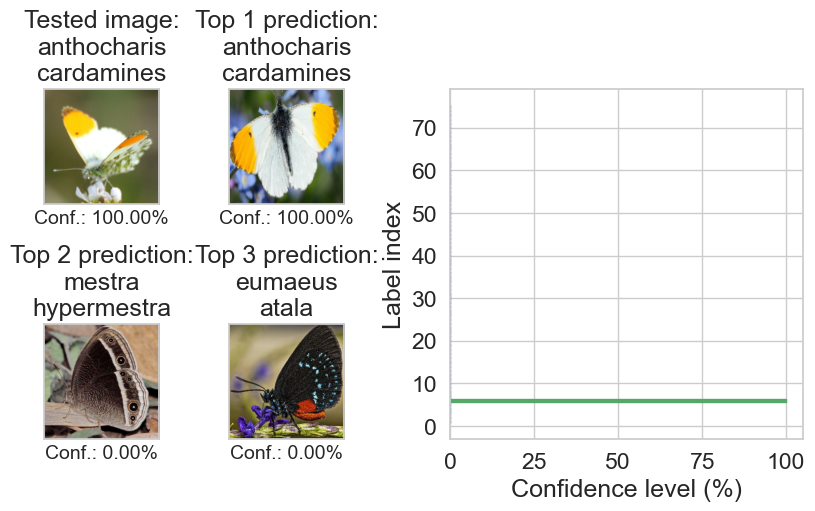

anthocharis cardamines
1/1 [==============================] - 0s 52ms/step


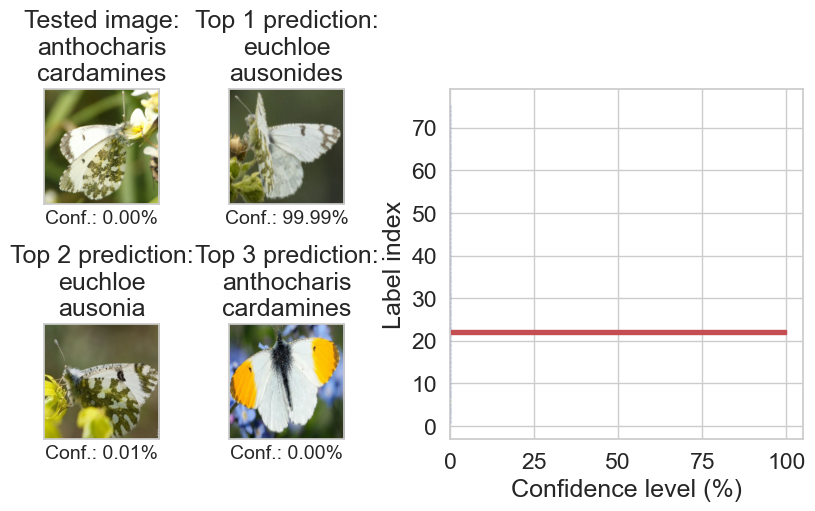

anthocharis cardamines
1/1 [==============================] - 0s 52ms/step


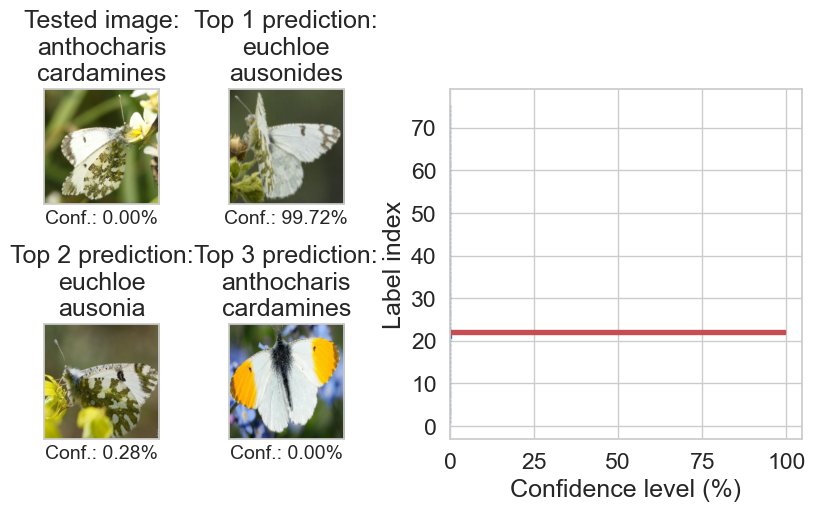

anthocharis cardamines
1/1 [==============================] - 0s 33ms/step


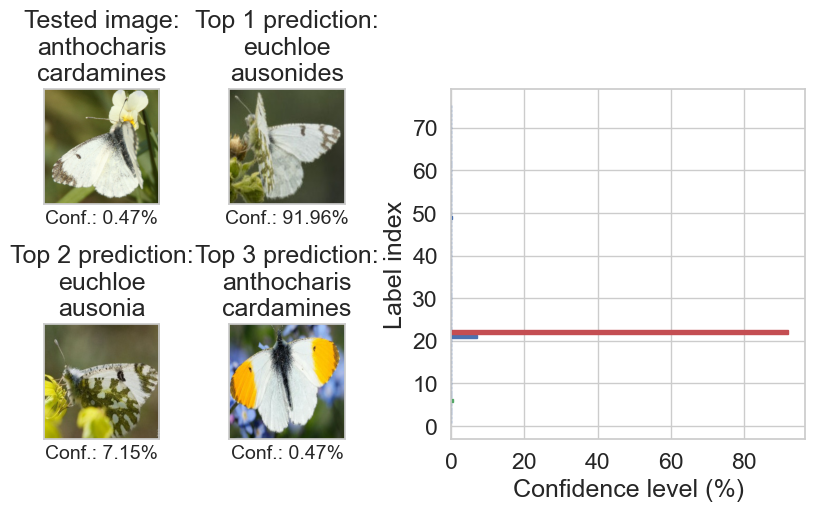

favonius quercus
1/1 [==============================] - 0s 35ms/step


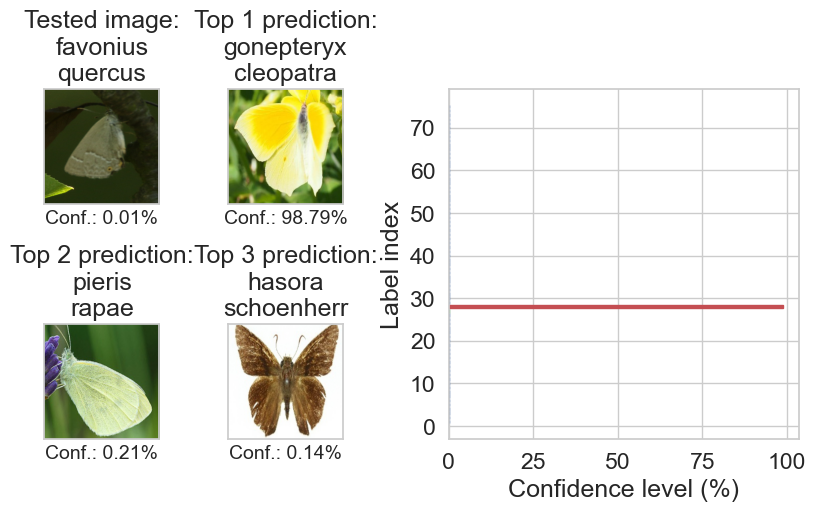

favonius quercus
1/1 [==============================] - 0s 83ms/step


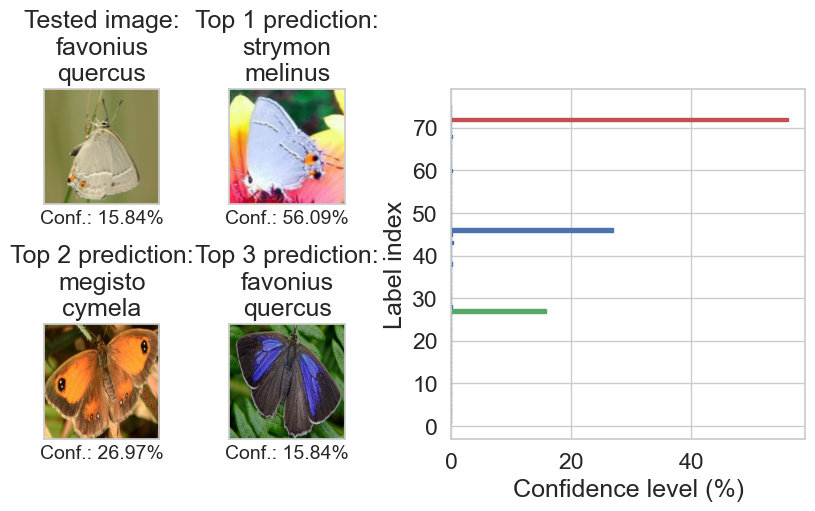

favonius quercus
1/1 [==============================] - 0s 35ms/step


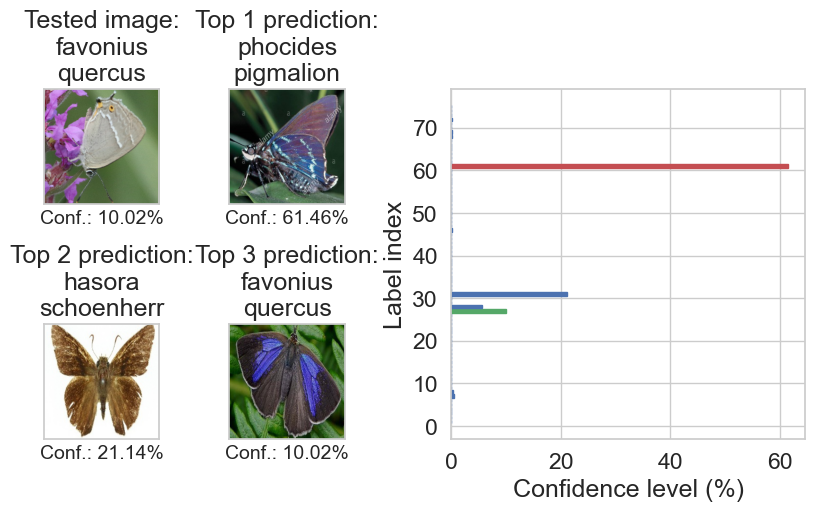

favonius quercus
1/1 [==============================] - 0s 79ms/step


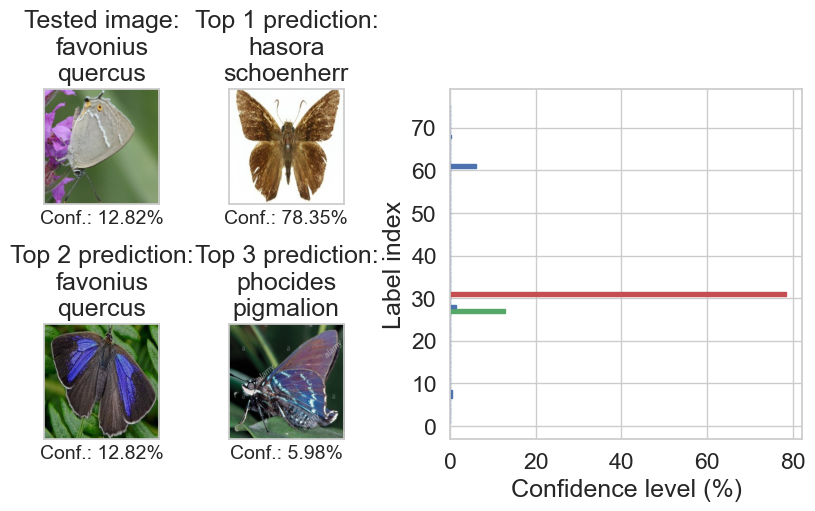

favonius quercus
1/1 [==============================] - 0s 39ms/step


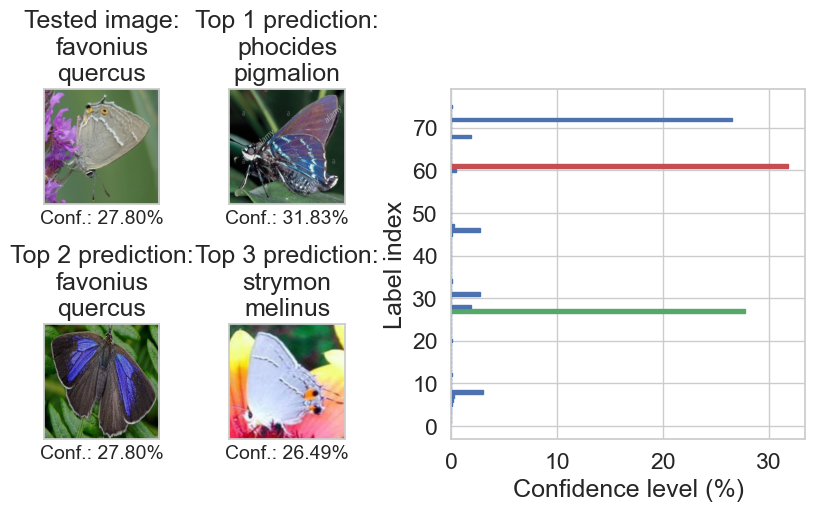

favonius quercus
1/1 [==============================] - 0s 40ms/step


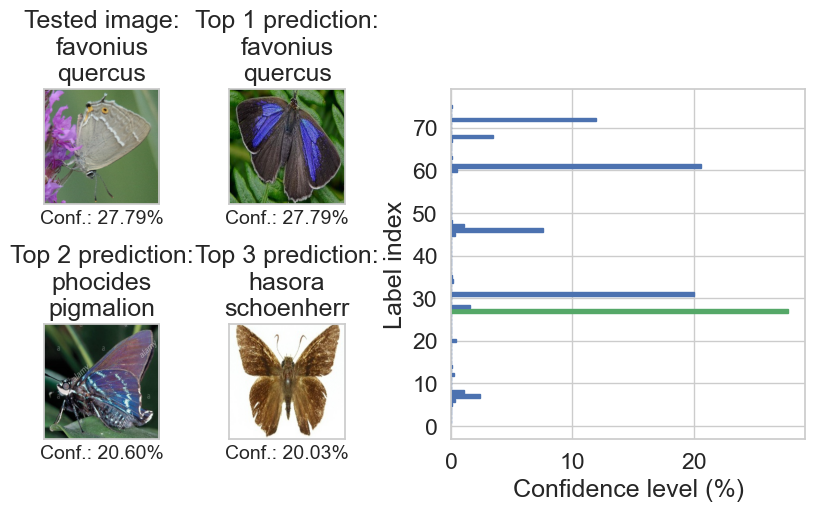

favonius quercus
1/1 [==============================] - 0s 45ms/step


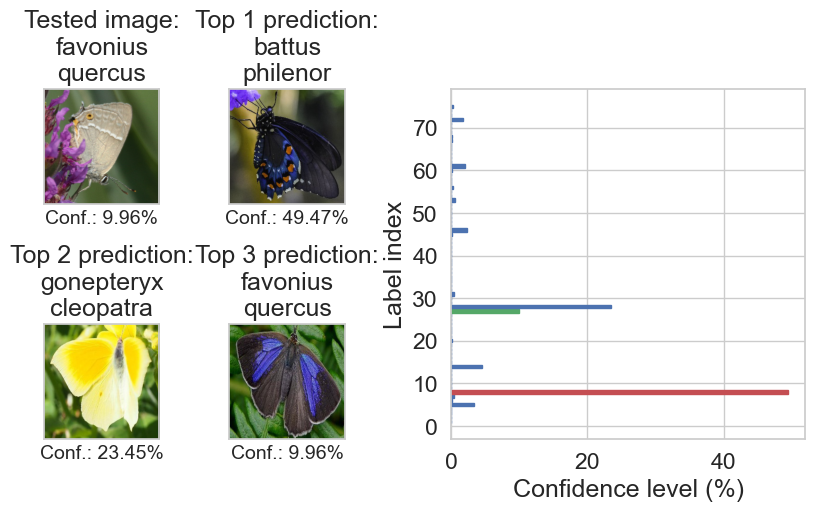

favonius quercus
1/1 [==============================] - 0s 35ms/step


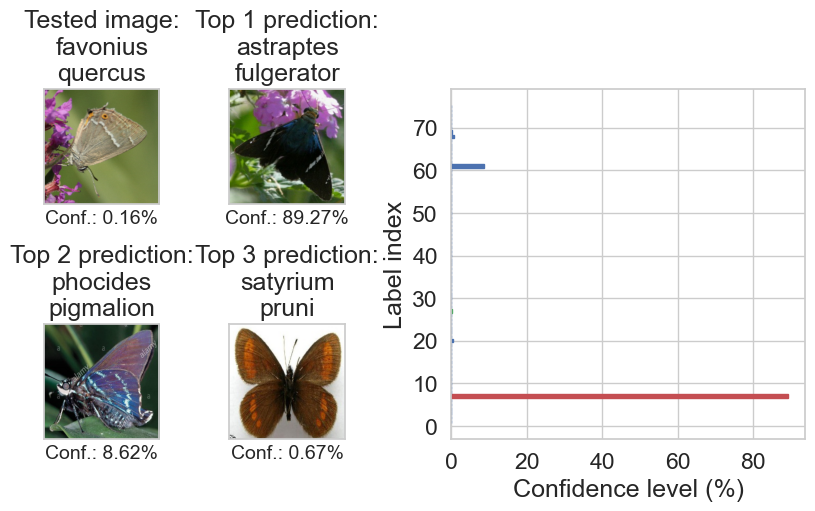

favonius quercus
1/1 [==============================] - 0s 36ms/step


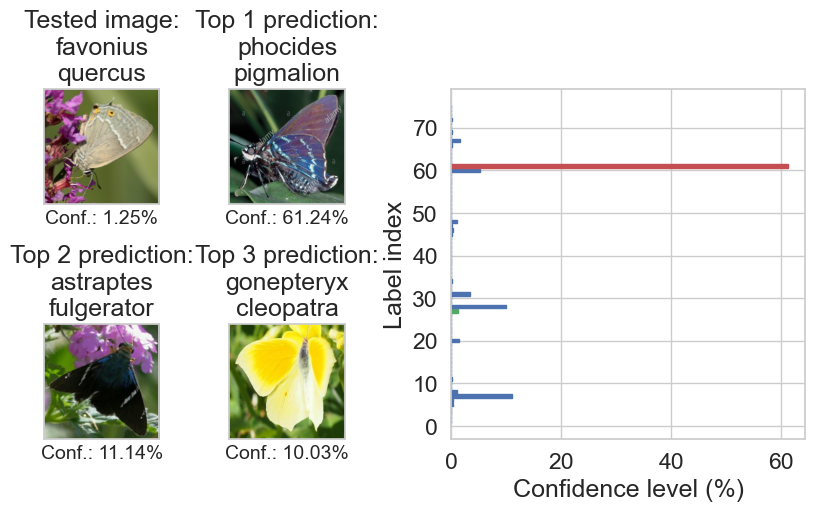

favonius quercus
1/1 [==============================] - 0s 45ms/step


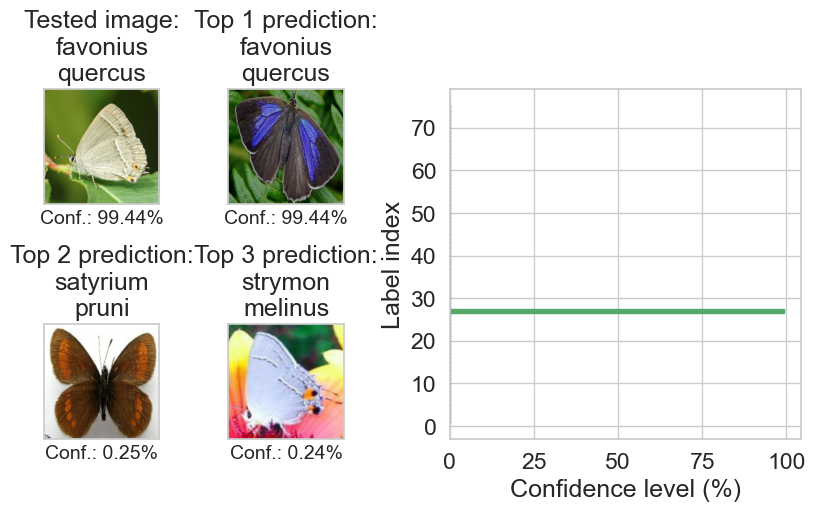

favonius quercus
1/1 [==============================] - 0s 35ms/step


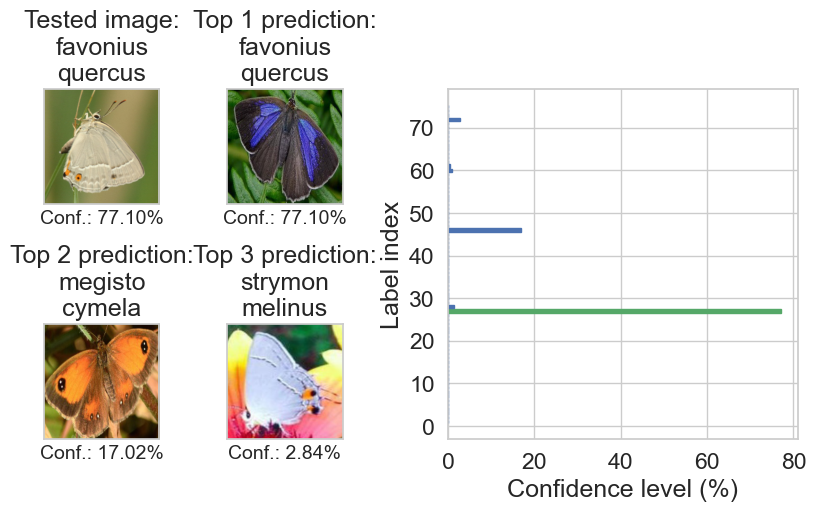

favonius quercus
1/1 [==============================] - 0s 58ms/step


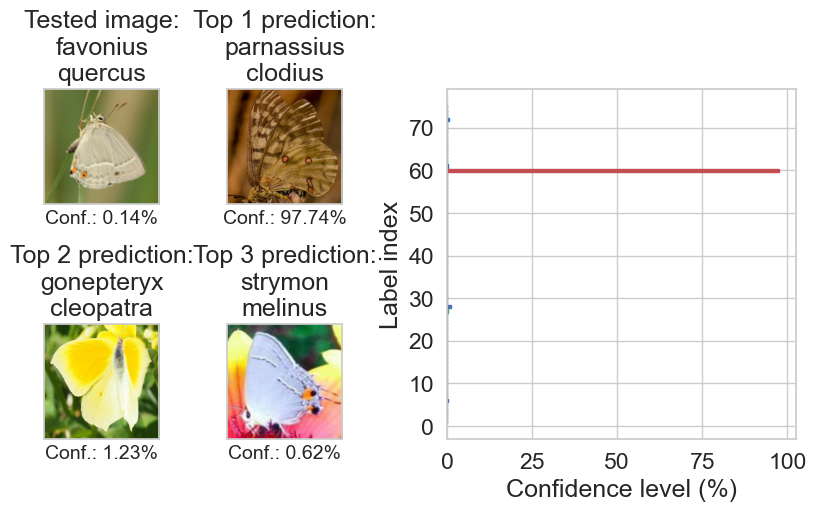

favonius quercus
1/1 [==============================] - 0s 39ms/step


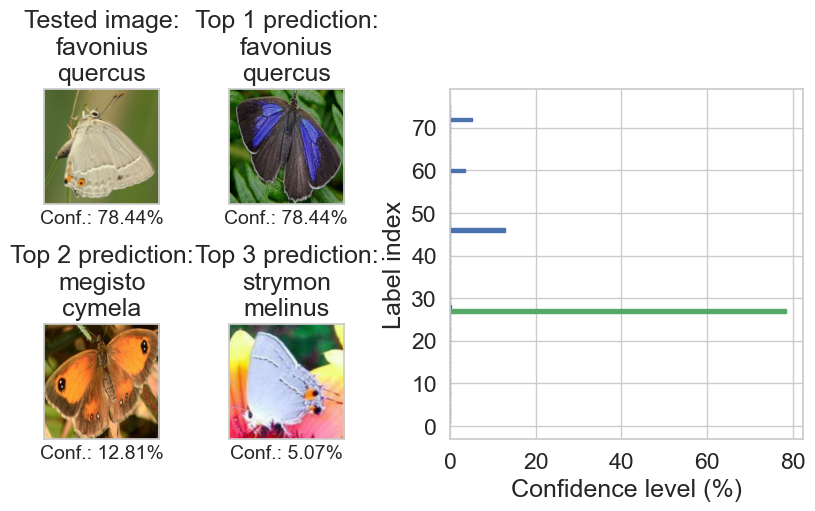

favonius quercus
1/1 [==============================] - 0s 38ms/step


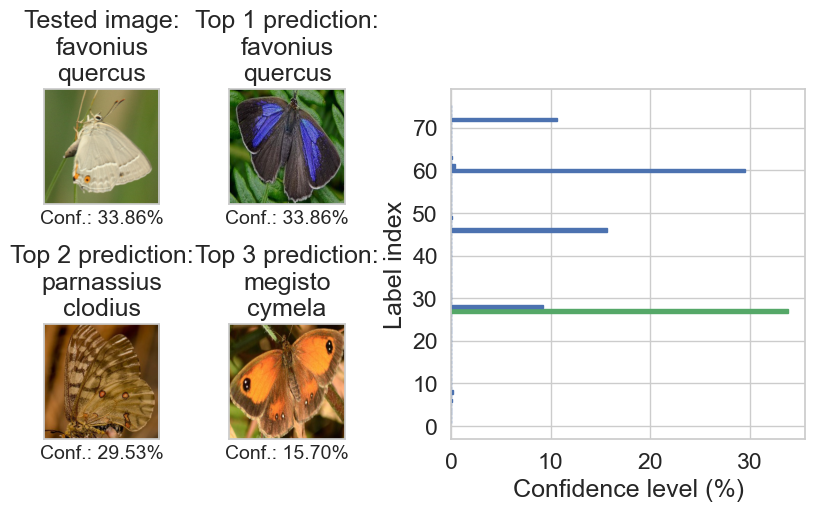

favonius quercus
1/1 [==============================] - 0s 34ms/step


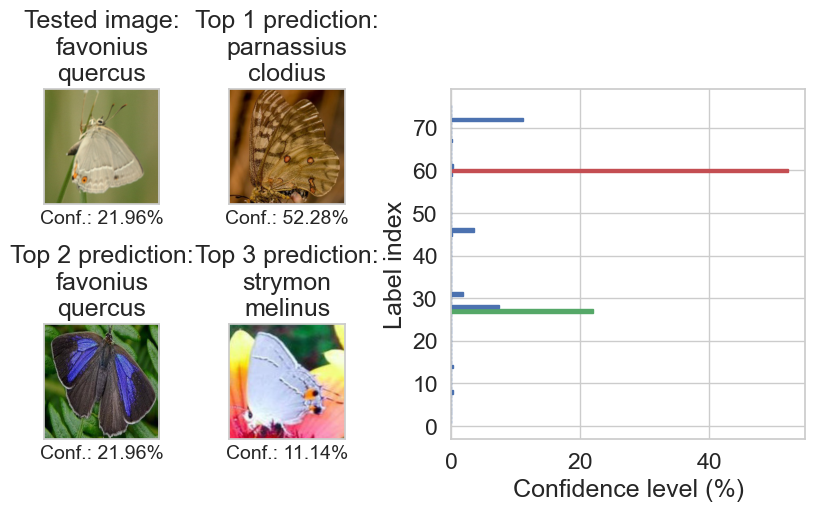

favonius quercus
1/1 [==============================] - 0s 39ms/step


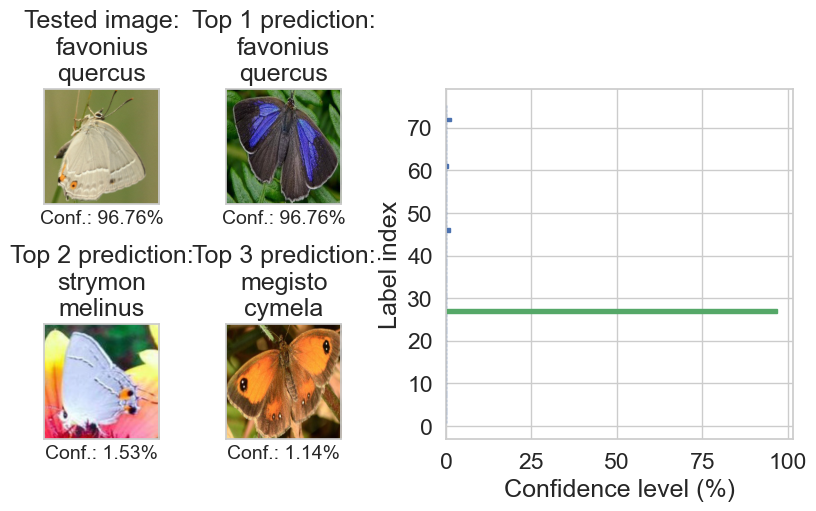

favonius quercus
1/1 [==============================] - 0s 36ms/step


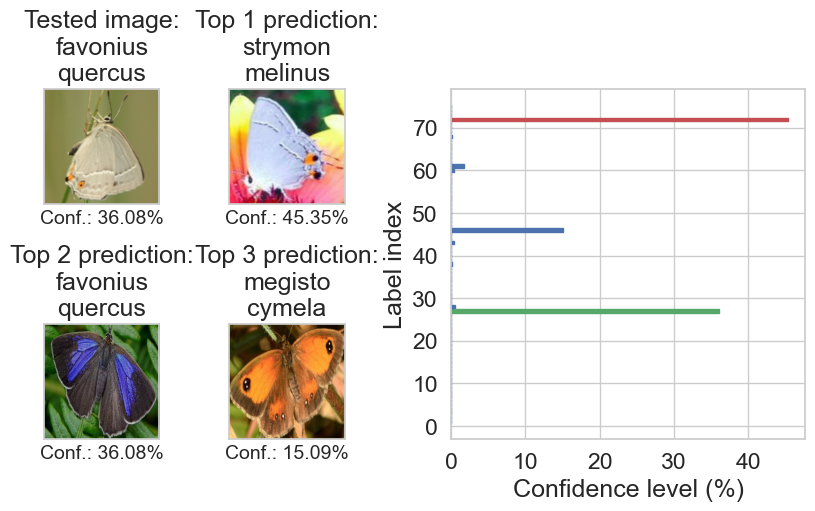

nymphalis antiopa
1/1 [==============================] - 0s 35ms/step


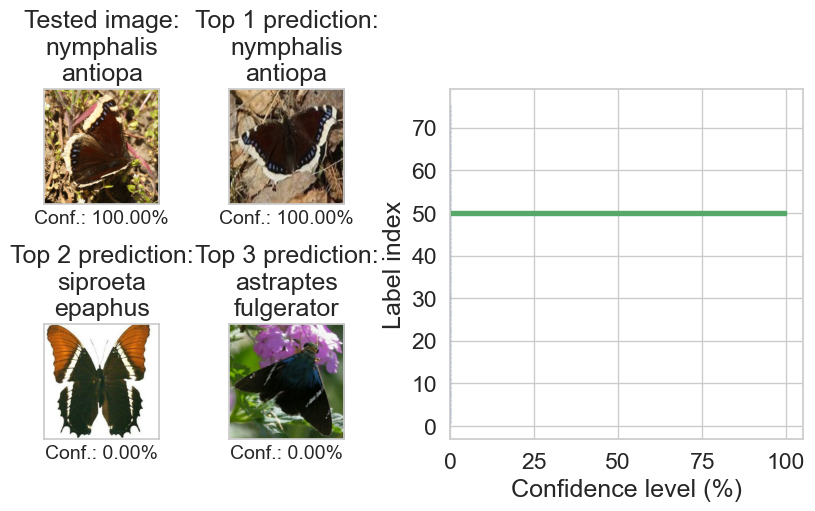

nymphalis antiopa
1/1 [==============================] - 0s 33ms/step


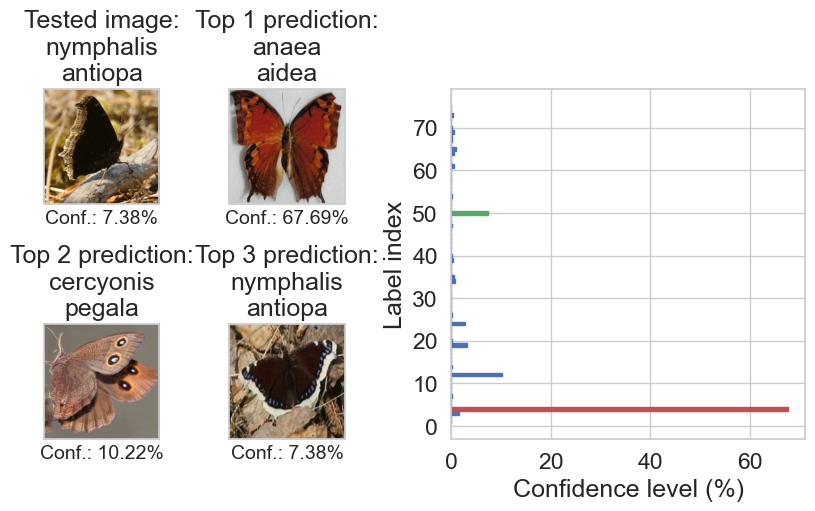

nymphalis antiopa
1/1 [==============================] - 0s 36ms/step


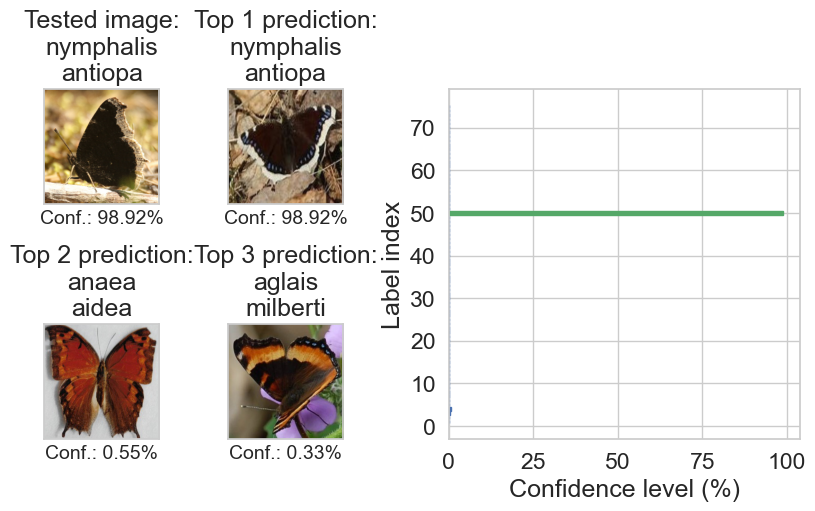

nymphalis antiopa
1/1 [==============================] - 0s 32ms/step


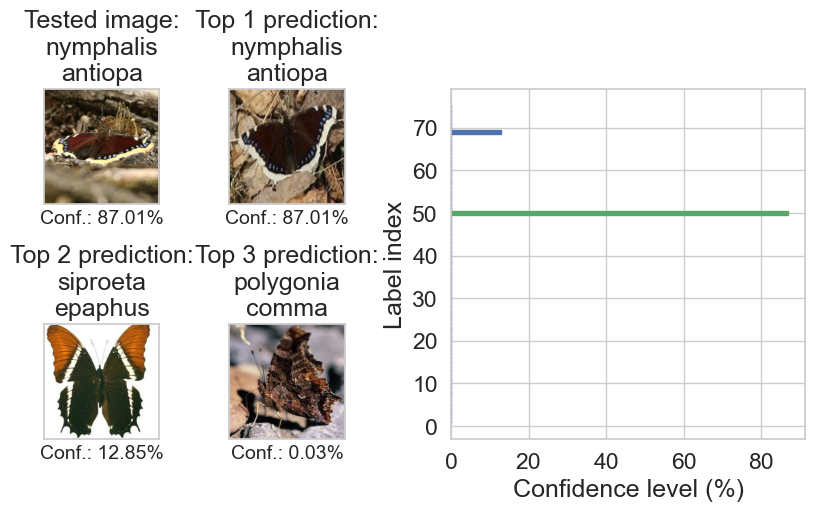

nymphalis antiopa
1/1 [==============================] - 0s 32ms/step


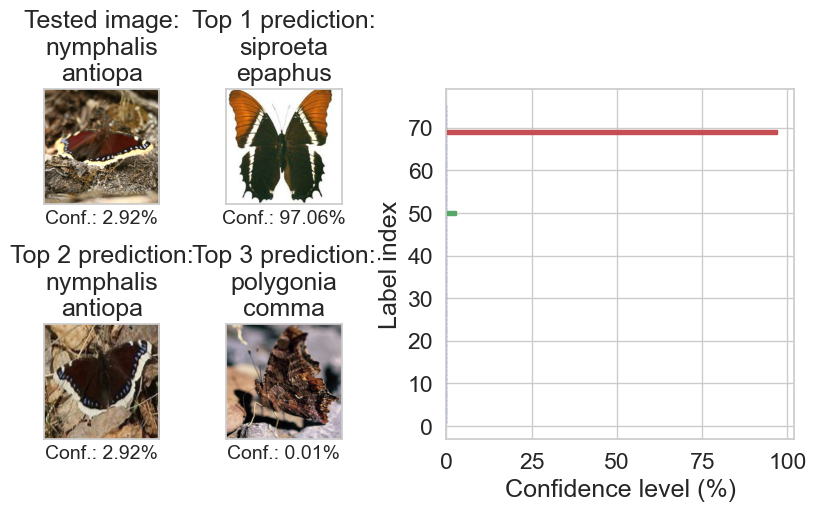

nymphalis antiopa
1/1 [==============================] - 0s 41ms/step


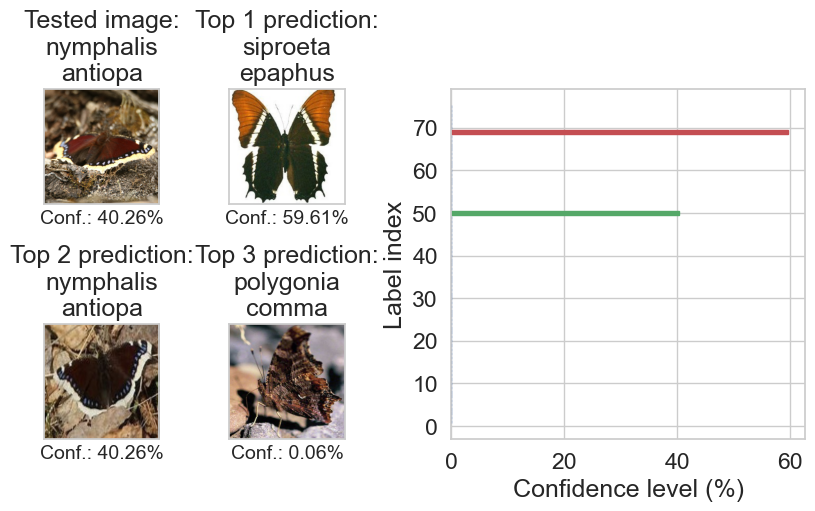

In [14]:
# For this specific plots
sns.set(font_scale=1.2, style='whitegrid')

# Loop over batches (here singletons) in the dataset
for X, y in ds.take(-1):
    species_true = butterfly_labels[y[0]] # Get the name of butterfly in the picture
    # Filter out species we are not interested in
    if species_true in ['nymphalis antiopa', 'favonius quercus', 'anthocharis cardamines']:
        print(species_true) # Print name
        distribution = model.predict(X)[0] # Make prediction
        tfu.plot_predictions(X[0], y[0], distribution, butterfly_labels, 'kaggle dataset', figsize=(8,5)) # Plot
        plt.show()

sns.set(font_scale=1.5, style='whitegrid')

## Influence of image quality

This section plots the results of image quality tests corresponding to Figure 4.4 in the thesis along with the examples of transformations corresponding to Figures 2.9-2.16 in the thesis. The cell below allows to choose the suffix of files that you want to plot.

In [15]:
SUFFIX = 'aug0'

### Brightness

<center> 

$I'=I+\beta$

c:\Users\Admin\anaconda3\envs\tf_direct\lib\site-packages\albumentations\augmentations\transforms.py:1149: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


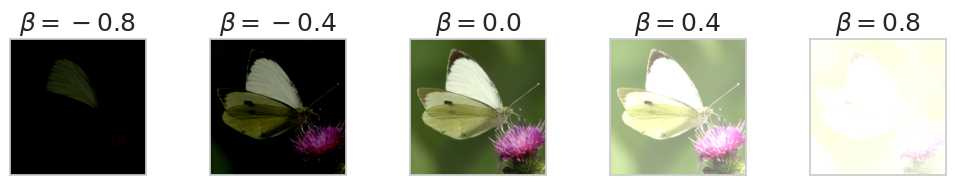

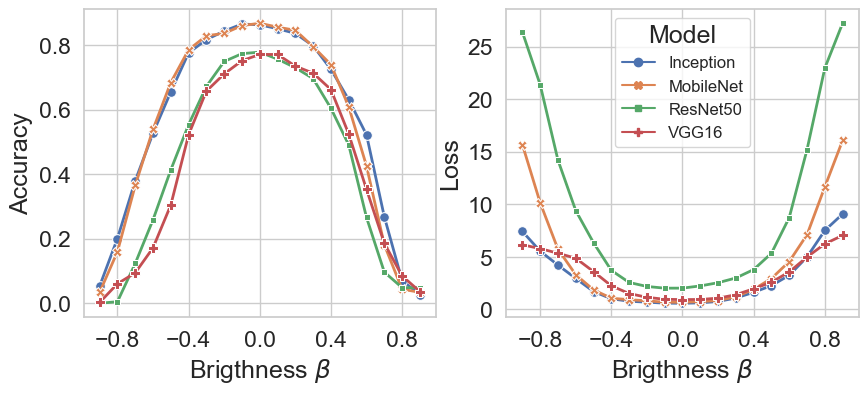

In [16]:
name = 'brightness' # Name of transformation
params = np.linspace(-0.8, 0.8, 5) # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('nature dataset/pieris rapae/7.jpg') # Image for reference images

transformations = [A.RandomBrightness(limit=(p, p), always_apply=True) for p in params] # List of transformations
titles = [f'$\\beta={p:.1f}$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
tfu.plot_quality_test(fpath, name, 'Brigthness $\\beta$', 'preset', legend='2')
plt.show()

### Contrast

<center> 

$I'=I\cdot(1+\alpha)$

c:\Users\Admin\anaconda3\envs\tf_direct\lib\site-packages\albumentations\augmentations\transforms.py:1175: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


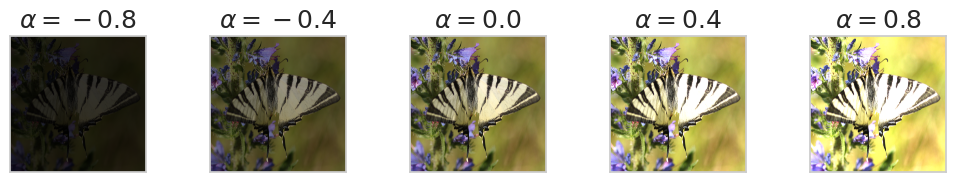

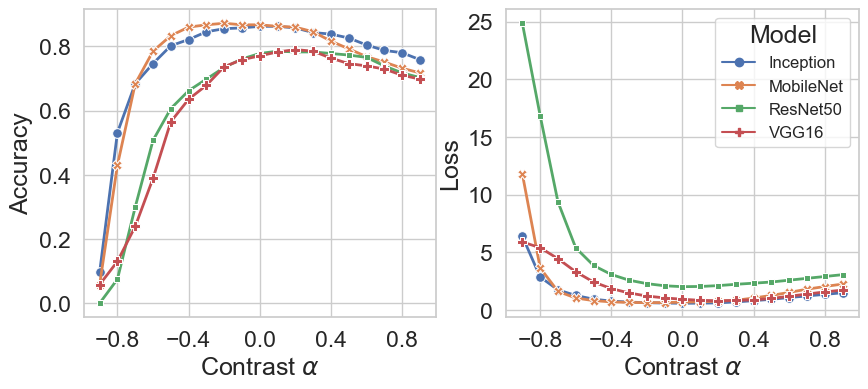

In [17]:
name = 'contrast' # Name of transformation
params = np.linspace(-0.8, 0.8, 5) # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('nature dataset/iphiclides podalirius/10.jpg') # Image for reference images

transformations = [A.RandomContrast(limit=(p, p), always_apply=True) for p in params] # List of transformations
titles = [f'$\\alpha={p:.1f}$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
tfu.plot_quality_test(fpath, name, 'Contrast $\\alpha$', 'preset', legend='2')
plt.show()

### Gamma correction

<center>

$I'=C\cdot I^\gamma$

$C=1$

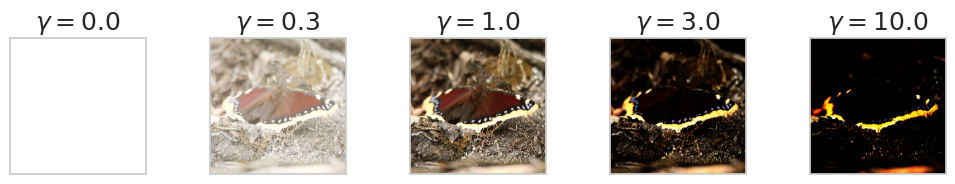

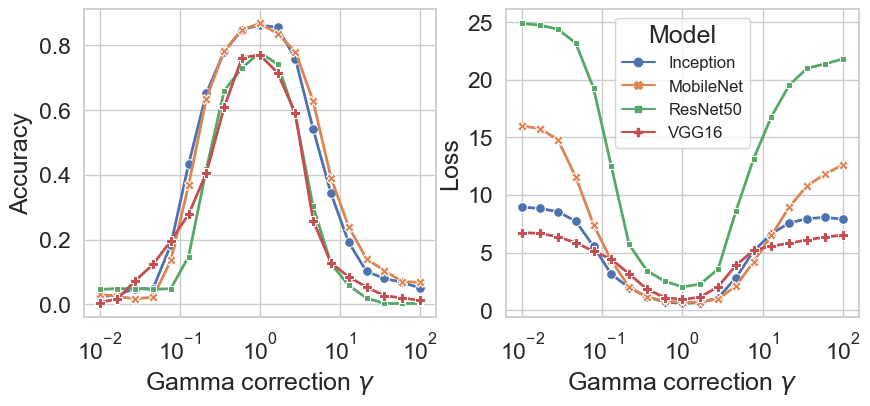

In [18]:
name = 'gamma' # Name of transformation
params = [0, 0.3, 1, 3.0, 10.0] # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('nature dataset/nymphalis antiopa/5.jpg') # Image for transformations

transformations = [A.RandomGamma(gamma_limit=(p*100, p*100), always_apply=True) for p in params] # List of transformations
titles = [f'$\\gamma={p:.1f}$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
tfu.plot_quality_test(fpath, name, 'Gamma correction $\\gamma$', [0.01, 0.1, 1, 10, 100], 'log', legend='2')
plt.show()

### Gaussian noise

<center>

$I'=I+Z$

$Z_{ij}\sim\mathcal{N}(0,\sigma^2)$

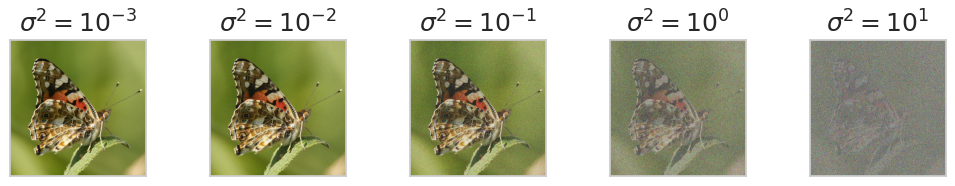

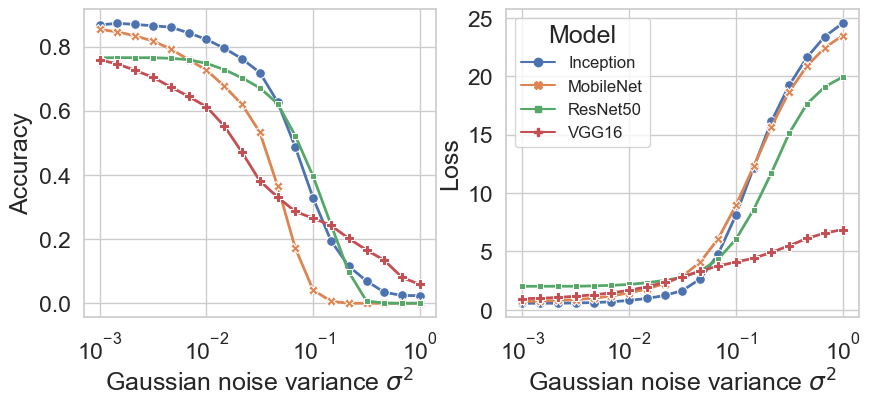

In [19]:
name = 'gauss_noise' # Name of transformation
params = np.linspace(-3, 1, 5) # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('nature dataset/vanessa cardui/8.jpg') # Image for transformations

transformations = [A.GaussNoise(var_limit=(10**p, 10**p), always_apply=True) for p in params] # List of transformations
titles = [f'$\\sigma^2=10^{{{p:.0f}}}$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
tfu.plot_quality_test(fpath, name, 'Gaussian noise variance $\\sigma^2$', [0.001, 0.01, 0.1, 1], 'log', legend='2')
plt.show()

### Gaussian blur

<center>

$I'=I\star C$

$C_{ij}\sim\mathcal{N}(0,\sigma^2)$, $3\leq i,j\leq k$

$\sigma=0.3\cdot\left(\frac{k-1}{2}-1)\right)+0.8$ or $k=[8\sigma]+2$

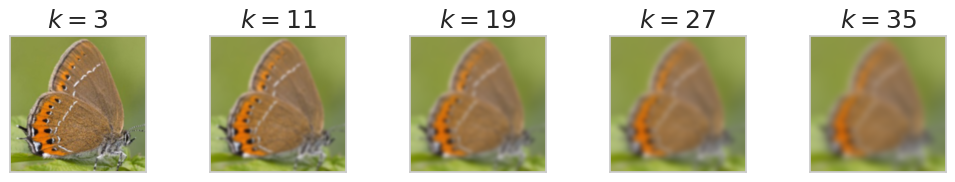

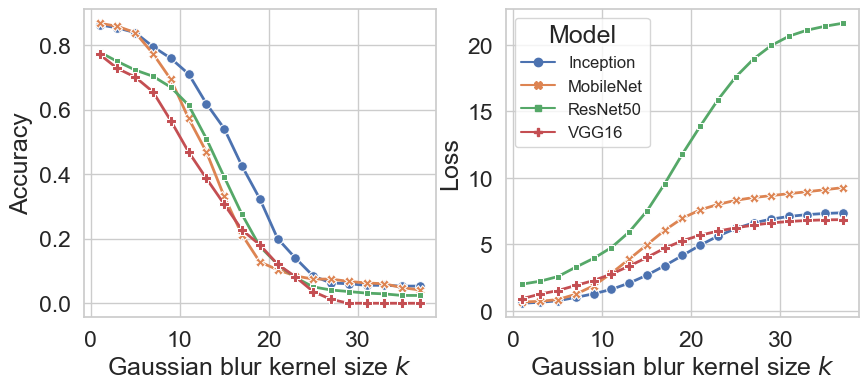

In [20]:
name = 'gauss_blur' # Name of transformation
params = [3, 11, 19, 27, 35] # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('kaggle dataset/satyrium pruni/0011.jpg') # Image for transformations

transformations = [A.GaussianBlur(blur_limit=(p, p), always_apply=True) for p in params] # List of transformations
titles = [f'$k={p:.0f}$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plot results
tfu.plot_quality_test(fpath, name, 'Gaussian blur kernel size $k$', 'auto', 'linear', legend='2')
plt.show()

### Motion blur

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


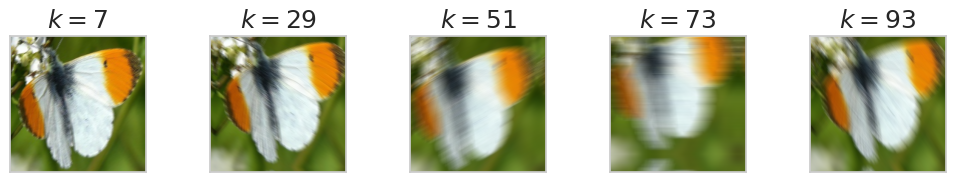

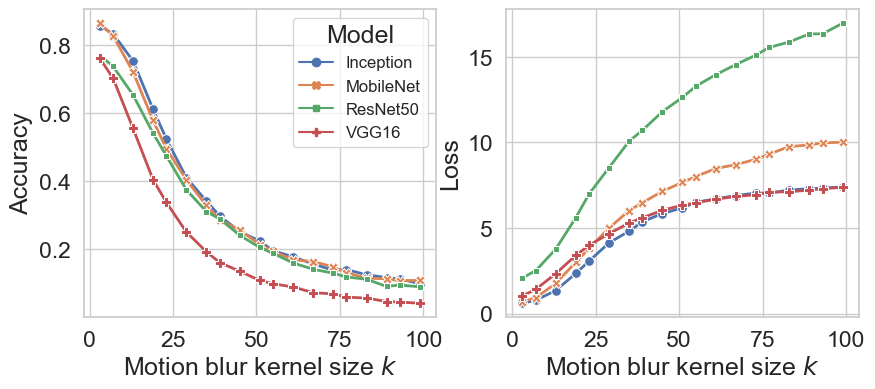

In [21]:
name = 'motion_blur' # Name of transformation
params = [7, 29, 51, 73, 93] # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('kaggle dataset/anthocharis cardamines/0055.jpg') # Image for transformations

transformations = [A.MotionBlur(blur_limit=(p, p), always_apply=True) for p in params] # List of transformations
titles = [f'$k={p:.0f}$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
tfu.plot_quality_test(fpath, name, 'Motion blur kernel size $k$', 'auto', 'linear', legend='1')
plt.show()

### Downscaling

c:\Users\Admin\anaconda3\envs\tf_direct\lib\site-packages\albumentations\augmentations\transforms.py:1554: UserWarning: Using default interpolation INTER_NEAREST, which is sub-optimal.Please specify interpolation mode for downscale and upscale explicitly.For additional information see this PR https://github.com/albumentations-team/albumentations/pull/584
  warnings.warn(


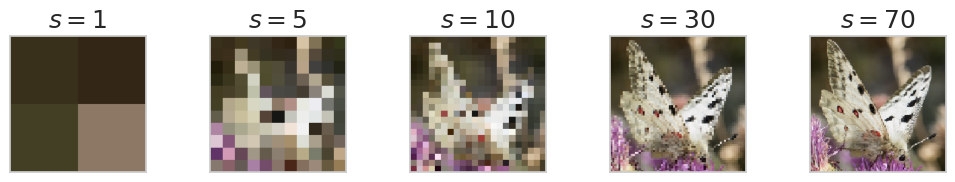

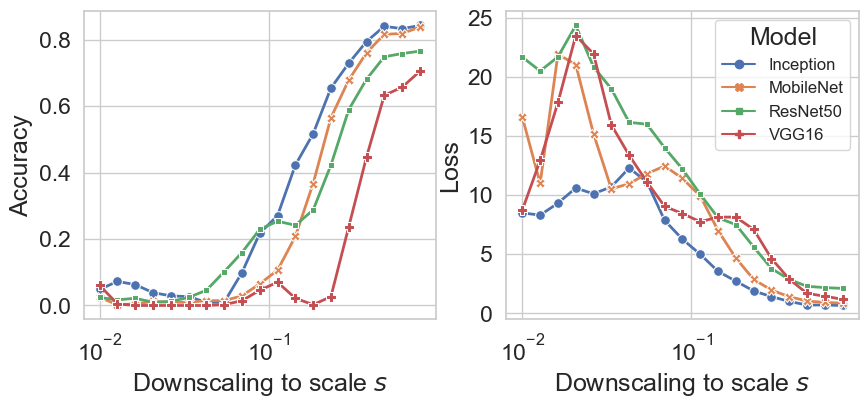

In [22]:
name = 'downscale' # Name of transformation
params = [0.01, 0.05, 0.1, 0.3, 0.7] # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('kaggle dataset/parnassius apollo/0106.jpg') # Image for transformations

transformations = [A.Downscale(scale_min=p, scale_max=p, always_apply=True) for p in params] # List of transformations
titles = [f'$s={p*100:.0f}%$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
tfu.plot_quality_test(fpath, name, 'Downscaling to scale $s$', 'auto', 'log', legend='2')
plt.show()

### Rotation

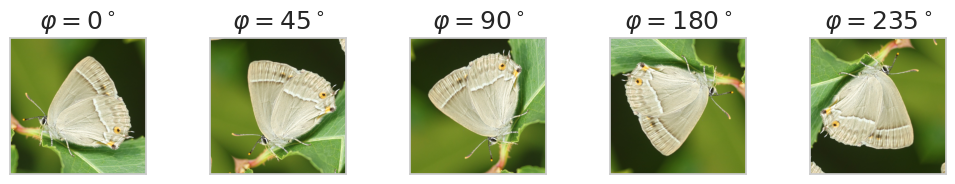

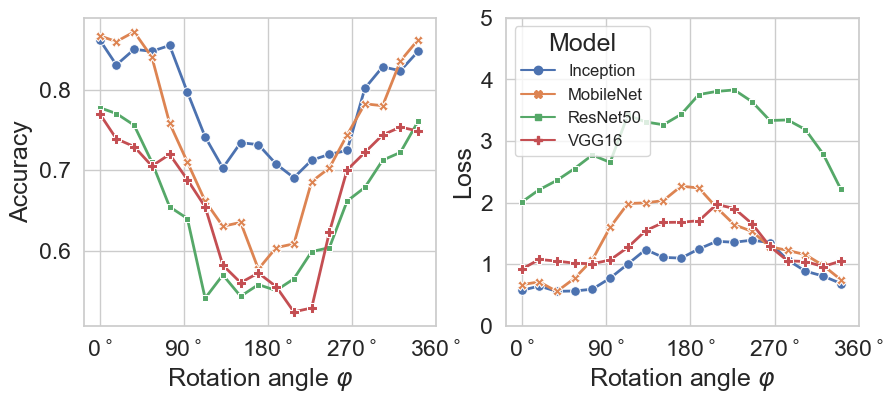

In [34]:
name = 'rotation' # Name of transformation
params = [0, 45, 90, 180, 235] # Parameters for transformations in reference images

fpath = f'{RPATH}/{name}_{SUFFIX}.csv' # Path to CSV file
image = plt.imread('nature dataset/favonius quercus/2.jpg') # Image for transformations

transformations = [A.Rotate(limit=(p, p), always_apply=True) for p in params] # List of transformations
titles = [f'$\\varphi={p:.0f}^\\circ$' for p in params] # List of titles

# Plotting transformations
tfu.plot_transformations(image, transformations, titles)
plt.show()
# Plotting results
_, axes = tfu.plot_quality_test(fpath, name, 'Rotation angle $\\varphi$', 'auto', legend='2')
[ax.set_xticks([0,90,180,270, 360], [f'{i}$^\circ$' for i in [0,90,180,270, 360]]) for ax in axes] # Adding degree symbols
plt.ylim(0,5) # Making room for legend
plt.show()

## Augmentation

In this section results of data augmentation are presented.

### Basic comparison

This cell creates a DataFrame with loss and accuracy tested on the pure Kaggle DS, augmented Kaggle DS and Nature DS for every selected model.

In [31]:
data = [] # List for rows

# Loop over models
for p in selected:
    info = tfu.load_json(f'{p}/info.json') # Loading info files
    data.append({ # Creating a single record
        'Model' : info['name'],
        'Test accuracy' : info['test_accuracy'],
        'Nature accuracy': info['nature_accuracy'],
        'Augmented accuracy': info['augmented_accuracy'],
        'Test loss' : info['test_loss'],
        'Nature loss': info['nature_loss'],
        'Augmented loss': info['augmented_loss'],
        'Augmentation proportion' : info['augmentation']
    })

df = pd.DataFrame(data)

df['Model'].replace('InceptionV3', 'Inception', inplace=True) # Renaming models
df = df[df['Model'].isin(['Inception', 'MobileNet'])] # Choosing only the models that were augmented

This cell produces plots of the accuracy tested on the three test data sets and how it changed for different augmentation proportions. It corresponds to Figure 4.5 in the thesis.

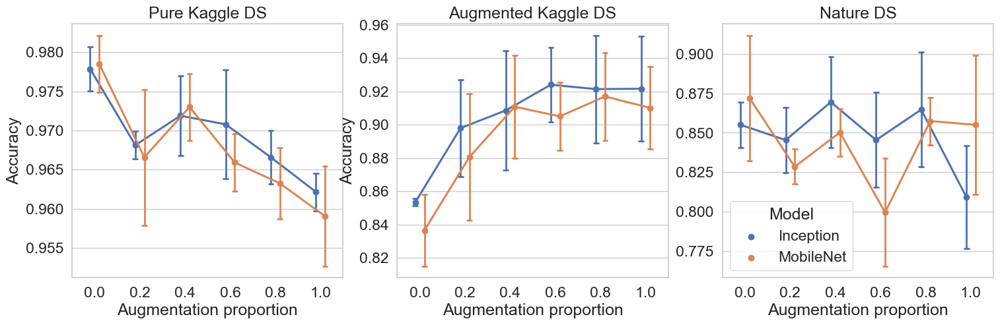

In [32]:
# Function producing a single subplot
def plot(y, ax, ylabel=None, title=None, **seaborn_kwargs):
    """
    Plots change of selected value with respect to augmentation proportion.
    ### Arguments
        - `y`: string with name of the column to plot on y-axis
        - `ax`: handle of axis on which the plot should be placed
        - `ylabel`: label of the y-axis
        - `title`: title of the subplot
        - `seaborn_kwargs`: optional arugments for seaborn `pointplot` function
    """
    sns.pointplot(
        df,
        x='Augmentation proportion',
        y=y,
        hue='Model',
        ax=ax,
        capsize=0.1,
        dodge=0.2,
        scale=0.8,
        errwidth=2,
        errorbar='sd',
        **seaborn_kwargs
    )
    if ylabel != None:
        ax.set_ylabel(ylabel)
    if title != None:
        ax.set_title(title)

# Creating figure
fig, axes = plt.subplots(1, 3, figsize=(18,5))

# Plot for the pure Kaggle DS
plot('Test accuracy', axes[0], 'Accuracy', 'Pure Kaggle DS')
axes[0].legend([],[],frameon=False)
# Plot for the augmented Kaggle DS
plot('Augmented accuracy', axes[1], 'Accuracy', 'Augmented Kaggle DS')
axes[1].legend([],[],frameon=False)
# Plot for the Nature DS
plot('Nature accuracy', axes[2], 'Accuracy', 'Nature DS')
axes[2].set_ylabel('')
plt.show()

This cell generates a table of the values presented in the above plots. It corresponds to accuracy values in Table 4.4 in the thesis.

In [33]:
df.groupby(['Model', 'Augmentation proportion'])\
    [['Test accuracy', 'Augmented accuracy', 'Nature accuracy']]\
    .agg(['mean','std']) * 100

Test accuracy       Augmented accuracy  \
                                           mean   std               mean   
Model     Augmentation proportion                                          
Inception 0.000                          97.786 0.284             85.348   
          0.200                          96.813 0.176             89.796   
          0.400                          97.189 0.507             90.859   
          0.600                          97.078 0.693             92.408   
          0.800                          96.658 0.341             92.143   
          1.000                          96.215 0.239             92.165   
MobileNet 0.000                          97.852 0.362             83.643   
          0.200                          96.658 0.867             88.070   
          0.400                          97.300 0.427             91.080   
          0.600                          96.591 0.366             90.505   
          0.800                          96.326 0.452             91.700   
          1.000                          95.905 0.638             91.014   

                                        Nature accuracy        
                                    std            mean   std  
Model     Augmentation proportion                              
Inception 0.000                   0.213          85.507 1.449  
          0.200                   2.922          84.541 2.092  
          0.400                   3.574          86.957 2.899  
          0.600                   2.232          84.541 3.017  
          0.800                   3.227          86.473 3.647  
          1.000                   3.164          80.918 3.268  
MobileNet 0.000                   2.147          87.198 3.991  
          0.200                   3.789          82.850 1.107  
          0.400                   3.086          85.024 1.508  
          0.600                   2.046          79.952 3.425  
          0.800                   2.649          85.749 1.508  
          1.000                   2.476          85.507 4.408

This cell computes the relative changes of accuracy for augmented models with respect to the models withou data augmentation. It corresponds to $\Delta_p$ in Table 4.4.

<center>

$\Delta_p=\frac{x_p-x_0}{x_0}\cdot100\%$

In [37]:
df_noaug = df[df['Augmentation proportion']==0].iloc[:,0:5].groupby('Model').mean()
(df.groupby(['Model','Augmentation proportion'])[['Test accuracy', 'Augmented accuracy', 'Nature accuracy']].mean() - df_noaug) / df_noaug * 100

Augmented accuracy  Nature accuracy  \
Model     Augmentation proportion                                        
Inception 0.000                                 0.000            0.000   
          0.200                                 5.213           -1.130   
          0.400                                 6.457            1.695   
          0.600                                 8.273           -1.130   
          0.800                                 7.962            1.130   
          1.000                                 7.988           -5.367   
MobileNet 0.000                                 0.000            0.000   
          0.200                                 5.292           -4.986   
          0.400                                 8.891           -2.493   
          0.600                                 8.203           -8.310   
          0.800                                 9.632           -1.662   
          1.000                                 8.812           -1.939   

                                   Test accuracy  Test loss  
Model     Augmentation proportion                            
Inception 0.000                            0.000        NaN  
          0.200                           -0.996        NaN  
          0.400                           -0.611        NaN  
          0.600                           -0.724        NaN  
          0.800                           -1.154        NaN  
          1.000                           -1.607        NaN  
MobileNet 0.000                            0.000        NaN  
          0.200                           -1.220        NaN  
          0.400                           -0.564        NaN  
          0.600                           -1.288        NaN  
          0.800                           -1.559        NaN  
          1.000                           -1.989        NaN

### Image quality influence revisited

This cell defines some auxiliary functions that are used to calculate and present results. The generated plots correspond to Figure 4.6 from the thesis. Values on the barplots correspond to the realtive change of average level of accuracy for every transformation parameters, so the average over the data points on the trajectory plot.  

In [72]:
def load_dataframes(transformation_name, suffixes):
    """
    Load CSV files for given transformation with the specified list of suffixes, 
    treating the first suffix as the point of reference.
    
    ### Arguments
        - `transformation_name`: name of the transformation, as in the file names
        - `suffixes`: list of suffixes to go through
    
    ### Returns
        - List of parameters used in generating the resuls
        - The point of reference dataframes
        - List of remaining dataframes    
    """
    # Loading DataFrames
    dfs = [pd.read_csv(
        f'{RPATH}/{transformation_name}_{suffix}.csv',
        usecols=[2,3,4,5],
        converters={transformation_name: (lambda i: round(float(i),6))}) # Parameter values are rounded for proper grouping
        for suffix in suffixes]
    
    # Creating list of parameters
    params = dfs[0][transformation_name].unique()

    # Selecting only augmented models, renaming them, setting index to transformation and capitalizing column names
    for i in range(len(dfs)):
        dfs[i] = dfs[i][dfs[i]['model'].isin(['InceptionV3', 'MobileNet'])]
        dfs[i]['model'].replace('InceptionV3', 'Inception', inplace=True)
        dfs[i].set_index(transformation_name, inplace=True)
        dfs[i].columns = [c.capitalize() for c in dfs[i].columns]

    return params, dfs[0], dfs[1:]


def get_changes(df0, dfs, aug_props, relative=False, percentages=False):
    """
    Create a DataFrame of changes of values from dfs and df0.
    
    ### Arguments
        - `df0`: result DataFrame being the point of reference
        - `df0`: list of result DataFrames that we want to compare
        - `aug_props`: list of augmentation proportion values that are in dfs list (so except 0)
        - `relative`: whether to compute relative changes
        - `percentages`: whether to display relative changes as percentages
    
    ### Returns
        A DataFrame with models, augmentation proportions and changes in accuracy and loss.
    """

    # List for records of new DataFrame
    data = []

    # Loop over DataFrames and proportions
    for aug, df in zip(aug_props, dfs):
        # Calculating scale to which the changes will be normalised
        scale = df0.groupby('Model').mean() if relative else 1 # If relative, the scale is the values in reference df
        scale = scale / 100 if percentages and relative else scale # If percentages, we additionaly scale it by 100

        # Computing the relative changes - values averaged over model instances and transformation parameters
        result = (df.groupby('Model').mean() - df0.groupby('Model').mean()) / scale

        # Loop over models
        for model in df['Model'].unique():
            # Create a record of output DataFrame
            data.append({
                'Augmentation proportion': round(aug, 1),
                'Loss': result.loc[model, 'Loss'],
                'Accuracy': result.loc[model, 'Accuracy'],
                'Model': model
            })
    return pd.DataFrame(data)


def plot_changes(df, y, ylabel=None, title=None, ax=None, percentages=False, **seaborn_kwargs):
    """
    Create a barplot on a given axes based on the DataFrame created by `get_changes`.

    ### Arguments
        - `df`: DataFrame returned by `get_changes`
        - `y`: the metric we want to plot, 'Accuracy' or 'Loss'
        - `ylabel`: label of y-axis
        - `title`: title of the axes
        - `ax`: handler of the axes to plot
        - `percentages`: if changes are in percentages
        - `seaborn_kwargs`: any additional arguments passed to seaborn `barplot` method
    """

    # Create a plot
    sns.barplot(df, x='Augmentation proportion', y=y, hue='Model', ax=ax, **seaborn_kwargs)
    
    # Remove legend
    ax.legend([],[],frameon=False)

    # Add y-axis label
    if ylabel is not None:
        ax.set_ylabel(ylabel)

    # Add title
    if title is not None:
        ax.set_title(title)

    # Display percentages
    if percentages:
        ax.set_yticks(ax.get_yticks(), [f'{x:.0f}%' for x in ax.get_yticks()])
    

def plot_trajectories(df0, df1, y, aug, ax, xlabel=None, ylabel=None, title=None, xticks=None, scale='linear', **seaborn_kwargs):
    """
    Plot comparison of two trajectories of transformation metric stored in two DataFrames with results.
    
    ### Arguments
        - `df0`: first DataFrame
        - `df1`: second DataFrame
        - `y`: name of the metric, 'Accuracy' or 'Loss'
        - `aug`: augmentation proportion to display in the legend
        - `ax`: handler of the axes to plot
        - `xlabel`: label of x-axis
        - `ylabel`: label of y-axis
        - `title`: title of plot
        - `xticks`: list of x-axis ticks
        - `scale`: scale of x-axis, `linear` or `log`
        - `seaborn_kwargs`: any additional arguments passed to seaborn `lineplot` method
    """

    # Concatenate both DataFrames
    df = pd.concat([df0, df1])
    # Add a column to differentiate them - augmentation proportion (we assume the reference point has p=0)
    df['Aug. prop.'] = [0.0] * df0.shape[0] + [aug] * df1.shape[0]

    # Create plot
    sns.lineplot(
        df, 
        y=y,
        errorbar=None, 
        markers=True,
        style='Aug. prop.', 
        hue='Model', 
        palette='deep', 
        **seaborn_kwargs)
    
    # Scale of x-axis
    ax.set_xscale(scale)
    # Decrease font size of legend, so it does not obscures the plot
    ax.legend(fontsize=12)
    # Label of x-axis
    if xlabel is not None:
        ax.set_xlabel(xlabel)
    # Label of y-axis
    if ylabel is not None:
        ax.set_ylabel(ylabel)
    # Title of plot
    if title is not None:
        ax.set_title(title)
    # Custom x-axis ticks
    if xticks is not None:
        ax.set_xticks(xticks)

#### Brightness

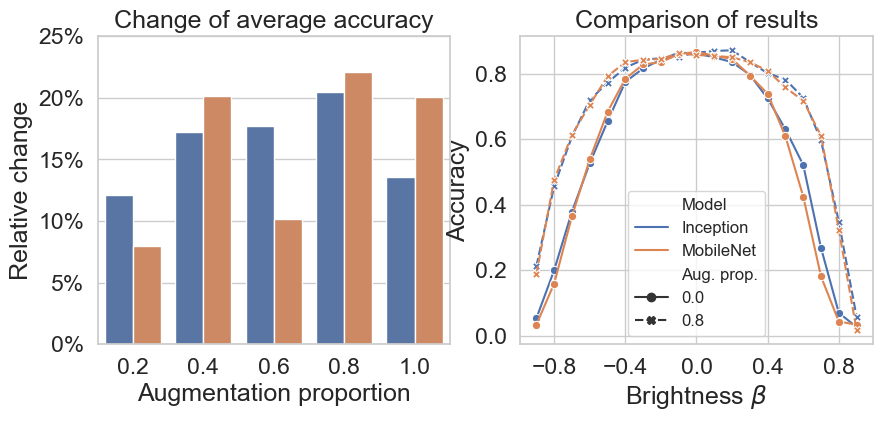

In [73]:
transformation_name = 'brightness' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[3], 
    'Accuracy',
    0.8, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Brightness $\\beta$',
    xticks= parameters[1::4],
    x=transformation_name)
plt.show()

#### Contrast

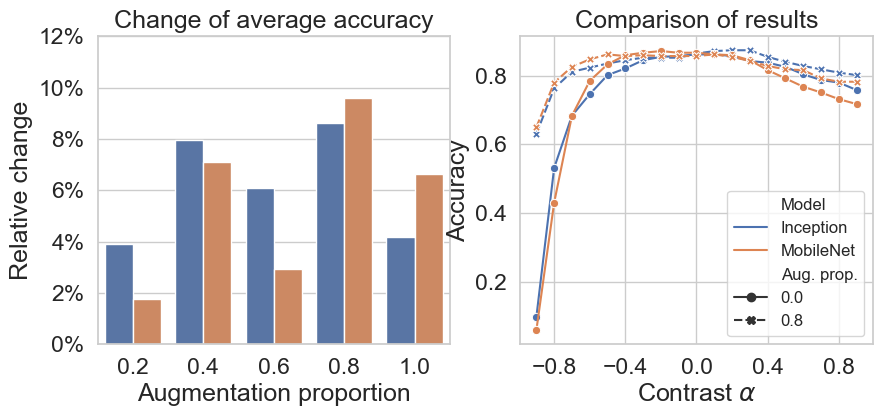

In [74]:
transformation_name = 'contrast' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[3], 
    'Accuracy',
    0.8, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Contrast $\\alpha$',
    xticks= parameters[1::4],
    x=transformation_name)
plt.show()

#### Gamma correction

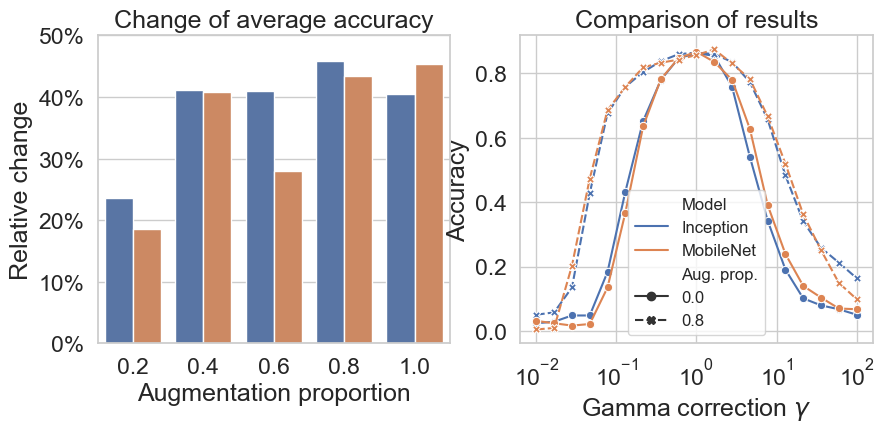

In [76]:
transformation_name = 'gamma' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[3], 
    'Accuracy',
    0.8, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Gamma correction $\gamma$',
    xticks=[0.01, 0.1, 1, 10, 100],
    scale='log',
    x=transformation_name)
plt.show()

#### Gaussian noise

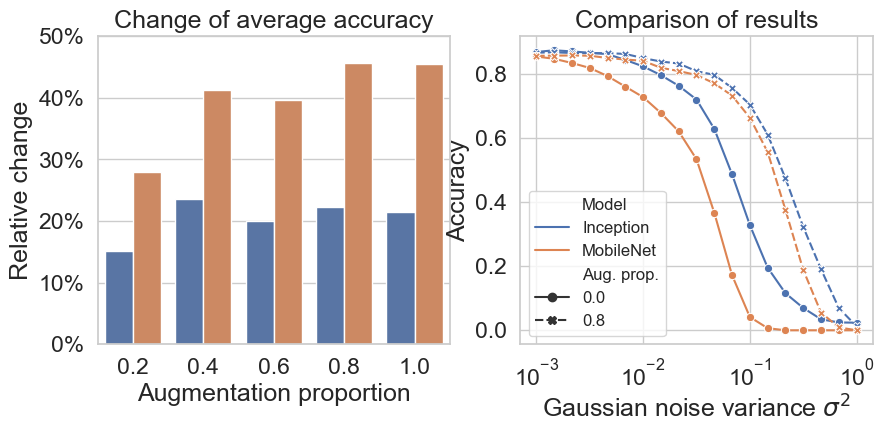

In [77]:
transformation_name = 'gauss_noise' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[3], 
    'Accuracy',
    0.8, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Gaussian noise variance $\sigma^2$',
    scale='log',
    x=transformation_name)
plt.show()

#### Gaussian blur

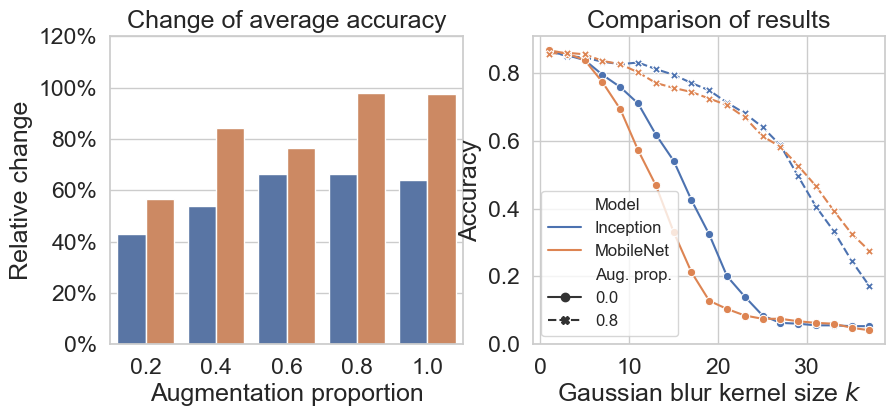

In [81]:
transformation_name = 'gauss_blur' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[3], 
    'Accuracy',
    0.8, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Gaussian blur kernel size $k$',
    x=transformation_name)
plt.show()

#### Motion blur

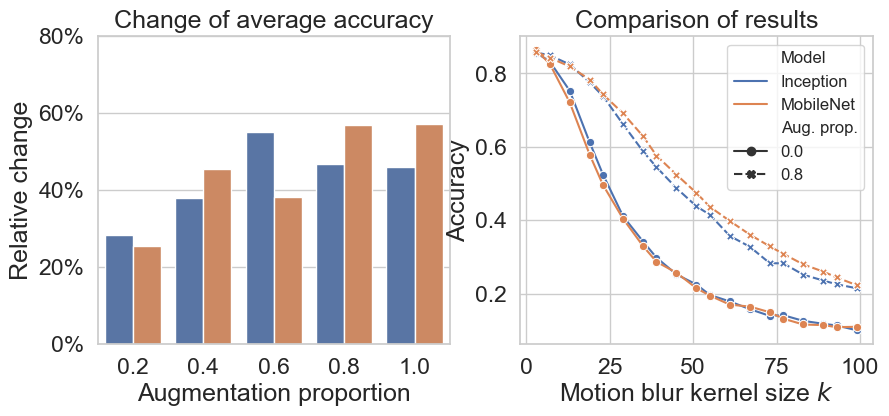

In [82]:
transformation_name = 'motion_blur' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[3], 
    'Accuracy',
    0.8, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Motion blur kernel size $k$',
    x=transformation_name)
plt.show()

#### Downscaling

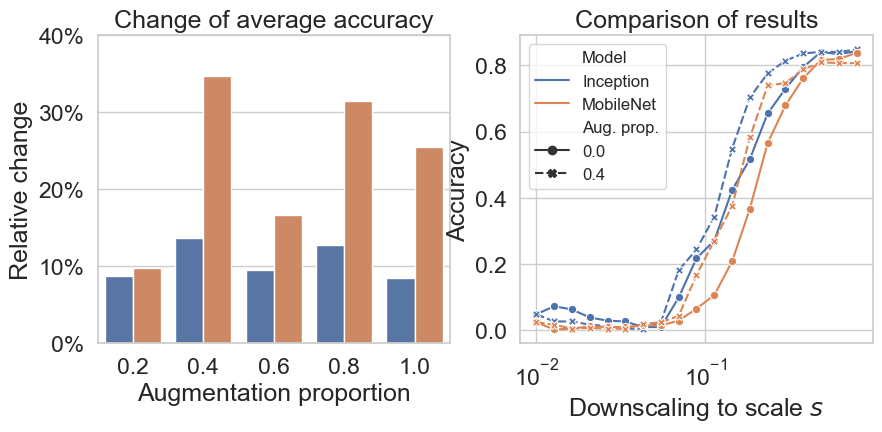

In [84]:
transformation_name = 'downscale' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[2], 
    'Accuracy',
    0.4, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Downscaling to scale $s$',
    scale='log',
    x=transformation_name)
plt.show()

#### Rotation

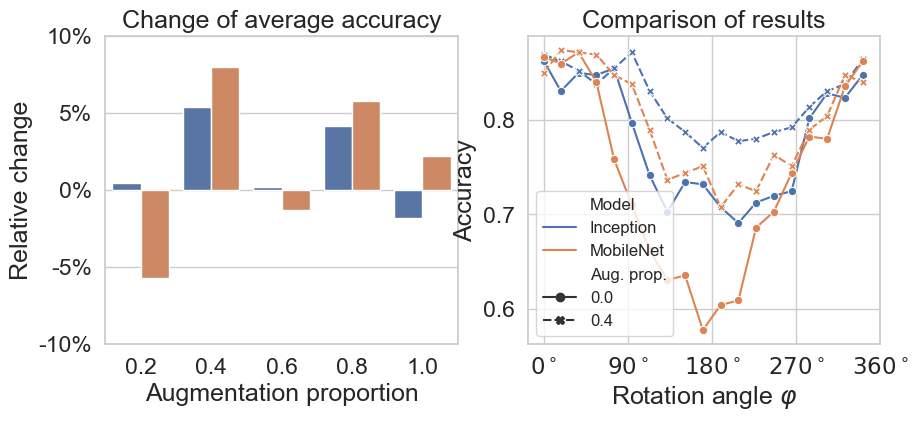

In [87]:
transformation_name = 'rotation' # Name of transformation
augs = [0, .2, .4, .6, .8, 1.0] # List of proportions
parameters, df0, dfs = load_dataframes(transformation_name, [f'aug{a*100:.0f}' for a in augs]) # Load DataFrames

result_df = get_changes(df0, dfs, augs[1:], True, True) # Compute relative changes displayed as percentages

# Create a figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
# Plot changes in first subplot
plot_changes(
    result_df, 
    'Accuracy', 
    'Relative change', 
    'Change of average accuracy', 
    axes[0], 
    True)
# Plot comparison of trajectories in second subplot
plot_trajectories(
    df0, 
    dfs[1], 
    'Accuracy',
    0.4, 
    axes[1],  
    title='Comparison of results', 
    xlabel='Rotation angle $\\varphi$',
    x=transformation_name)
axes[1].set_xticks([0,90,180,270,360],[f'${i}^\circ$' for i in [0,90,180,270,360]])
plt.show()

## Additional visuals

### Illustration of overfitting on an example of polynomials

This cell creates a number of points generated by quadratic formula with some additional noise and is then fit with polynomials of degree 1, 2 and 5 as an illustration of underfitting, proper fitting and overfitting. It is used in Figure 2.3 in the thesis.

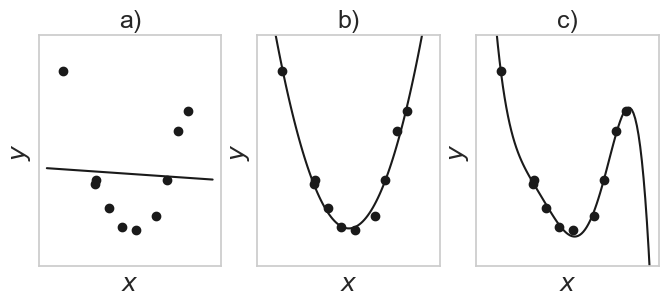

In [51]:
np.random.seed(10) # Setting random state
N = 10 # Number of points for fit

X = np.linspace(-3, 3, N) + np.random.normal(0, 1, N) # Generating x values of points
y = X ** 2 + np.random.normal(0, 0.5, N) # Generating y values of points

# Preparing fitting functions for different degrees of polynomial
underfit = np.poly1d(np.polyfit(X, y, 1))
proper_fit = np.poly1d(np.polyfit(X, y, 2))
overfit = np.poly1d(np.polyfit(X, y, 5))

# Preparing x values for plotting fit curves
x = np.linspace(-4, 4, 100)

# Function making a single subplot
def plot(fit, ax):
    ax.plot(x, fit(x), 'k-')
    ax.plot(X, y, 'ko')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylim([-2, 12])
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')

# Creating figure
fig, axes = plt.subplots(1, 3, figsize=(8, 3))

# Plotting
plot(underfit, axes[0])
plot(proper_fit, axes[1])
plot(overfit, axes[2])

# Setting titles
axes[0].set_title('a)')
axes[1].set_title('b)')
axes[2].set_title('c)')

plt.show()

### Example of feature maps

This cell generates feature maps for a single image calculated by the first convolutional block of the VGG16 model. They are used in Figure 2.7 in the thesis.

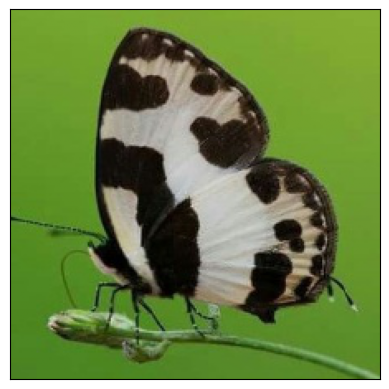

1/1 [==============================] - 0s 102ms/step


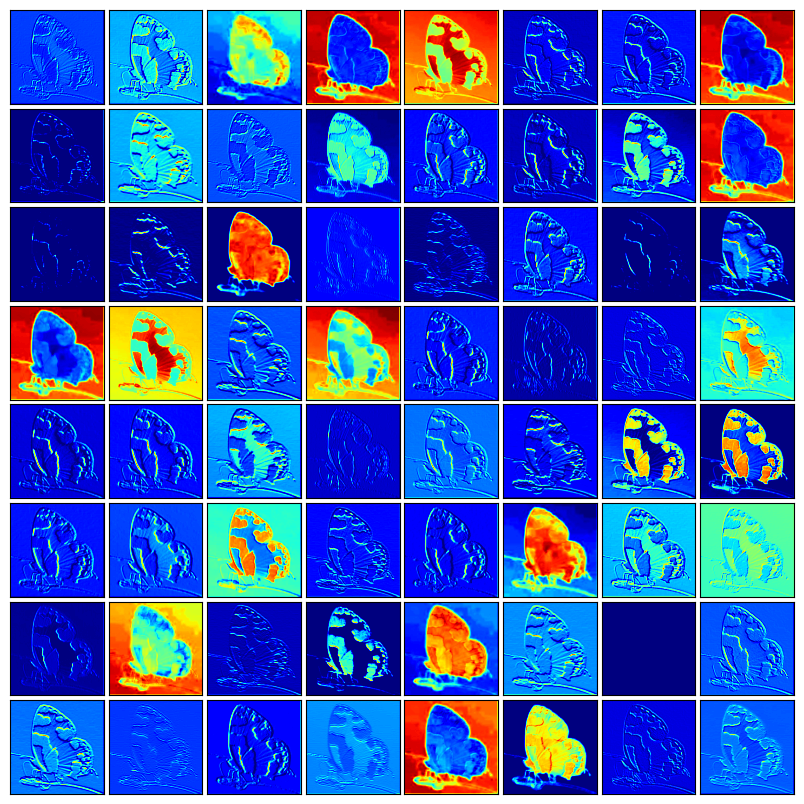

In [49]:
# Loading and preprocessing image
img = plt.imread('kaggle dataset/caleta elna/0t3.jpg')
img = np.array([img]).astype(float) / 255

# Displaying image
plt.imshow(img[0,:,:,:])
plt.xticks([])
plt.yticks([])
plt.show()

# Loading a trained model
model = tf.keras.applications.VGG16()

# Creating a model from the first convolutional block (first three layers)
conv_block1 = tf.keras.models.Model(inputs=model.inputs, outputs=[model.layers[2].output])

# Computing feature maps
feature_maps = conv_block1.predict(img)

# Displaying feature maps
fig, axes = plt.subplots(8, 8, figsize=(8, 8))
channel = 0
for i in range(8):
    for j in range(8):
        axes[i, j].imshow(feature_maps[0, :, :, channel], cmap='jet')
        channel += 1
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])

plt.subplots_adjust(left=0.01, bottom=0.01, right=0.99, top=0.99, wspace=0.05, hspace=0.05)
plt.show()

### Color channels of an RGB image

This cell divided an RGB image into its color channels and displays intensity of the pixels separately. It is used in Figure 2.8 in the thesis.

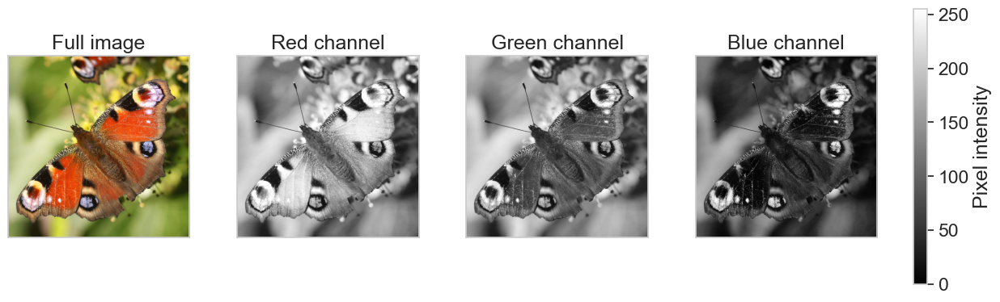

In [52]:
# Loading image
img = plt.imread('nature dataset/aglais io/5.jpg')

# Creating figure
fig, axes = plt.subplots(1, 4, figsize=(12,5))
fig.tight_layout(pad=0.05)

# Displaying full image
axes[0].imshow(img)
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_title('Full image')

# Displaying colour channels separately
t = ['Red', 'Green', 'Blue']
for i in range(3):
    c = axes[i+1].imshow(img[:,:,i], cmap='gray')
    axes[i+1].set_xticks([])
    axes[i+1].set_yticks([])
    axes[i+1].set_title(f'{t[i]} channel')

# Adding colorbar for intensity
fig.colorbar(c, ax=axes, label='Pixel intensity',fraction=0.015, pad=0.04)
plt.show()

### Sample images of all classes

This cell generates a grid of all butterfly species in the Kaggle DS with a sample image and name. With bold, the names of butterflies appearing in the Nature DS are marked. Plots are used in Figure 3.1 and 3.2 in the thesis.

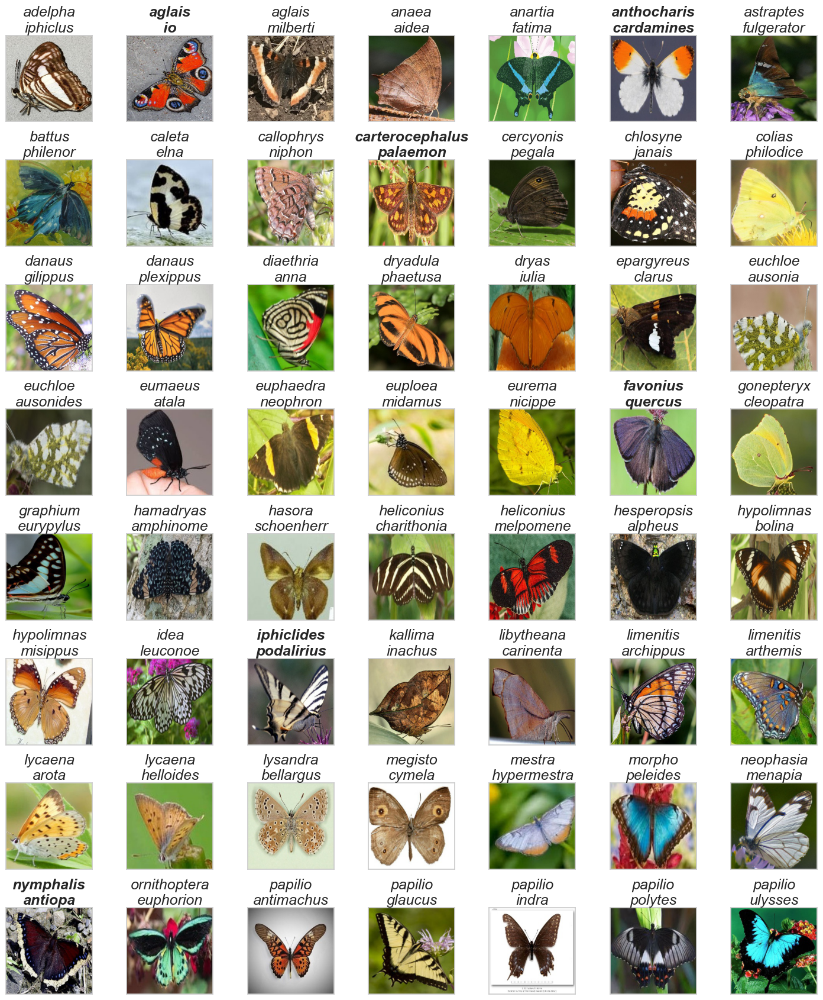

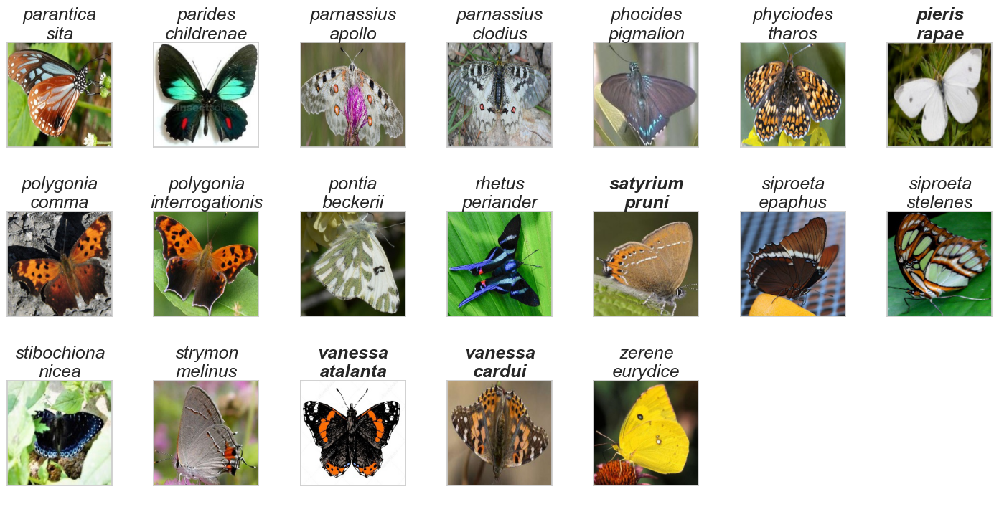

In [54]:
random.seed(123)

# Lists of class directories in the Kaggle DS and Nature DS
paths_kaggle = pathlib.Path('kaggle dataset').glob('*')
paths_nature = pathlib.Path('nature dataset').glob('*')

# Empty lists for shared classes, names and images
shared = []
names = []
images = []

# Setting grid shape
n1 = 8 # Rows in first figure
m1 = 7 # Columns in first figure
n2 = 3 # Rows in second figure
m2 = 7 # Columns in second figure

# Adjusting font size
plt.rcParams.update({'font.size': 14})

# Loop over classes
for p_k, p_n in zip(paths_kaggle, paths_nature):
    names.append(p_k.name) # Filling list of names
    
    # Choosing random sample image from the class and adding to list of images
    tmp = list(p_k.glob('*')) 
    images.append(plt.imread(tmp[random.randint(0,len(tmp)-1)]))

    # If there are images of this species in the Nature DS, mark it as shared image
    if len(list(p_n.glob('*'))) > 0:
        shared.append(p_n.name)

# Creating first figure
fig, axes = plt.subplots(n1, m1, figsize=(m1*2, n1*2+1))

itr = 0
for i in range(n1):
    for j in range(m1):
        if itr < 75:
            axes[i,j].imshow(images[itr])
            axes[i,j].set_xticks([])
            axes[i,j].set_yticks([])
            w = 'semibold' if names[itr] in shared else 'normal'
            axes[i,j].set_title(names[itr].replace(' ', '\n'), style='italic', fontweight=w, wrap=True)
            itr += 1
        else:
            axes[i,j].axis('off')


plt.subplots_adjust(left=0.01,
                    bottom=0.01,
                    right=0.99,
                    top=0.99,
                    wspace=0.4,
                    hspace=0.1)

plt.show()

# Creating second figure
fig, axes = plt.subplots(n2, m2, figsize=(m2*2, n2*2+1))
for i in range(n2):
    for j in range(m2):
        if itr < 75:
            axes[i,j].imshow(images[itr])
            axes[i,j].set_xticks([])
            axes[i,j].set_yticks([])
            w = 'semibold' if names[itr] in shared else 'normal'
            axes[i,j].set_title(names[itr].replace(' ', '\n'), style='italic', fontweight=w, wrap=True)
            itr += 1
        else:
            axes[i,j].axis('off')

plt.subplots_adjust(left=0.01,
                    bottom=0.01,
                    right=0.99,
                    top=0.99,
                    wspace=0.4,
                    hspace=0.1)

plt.show()

### Summary of data sets

This cell calculates sumamry statistics of both Kaggle DS and Nature DS. It corresponds to Table 3.1 in the thesis.

In [56]:
# Loading directories of data sets
paths_kaggle = pathlib.Path('kaggle dataset').glob('*')
paths_nature = pathlib.Path('nature dataset').glob('*')

# List for records in DateFrame
data = []

# Loop over classes
for p_k, p_n in zip(paths_kaggle, paths_nature):
    # Record for class in Kaggle DS
    data.append({
        'Species': p_k.name,
        'Data set': 'Kaggle DS',
        'Amount': len(list(p_k.glob('*')))
    })
    # Record for class in Nature DS
    if len(list(p_n.glob('*'))) > 0:
        data.append({
            'Species': p_k.name,
            'Data set': 'Nature DS',
            'Amount': len(list(p_n.glob('*')))
        })

df = pd.DataFrame(data)

df.groupby('Data set').agg(['count', 'sum', 'mean', 'median', 'std', 'min', 'max'])

C:\Users\Admin\AppData\Local\Temp\ipykernel_8292\2170257784.py:26: FutureWarning: ['Species'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  df.groupby('Data set').agg(['count', 'sum', 'mean', 'median', 'std', 'min', 'max'])


Amount                                        
           count    sum    mean  median    std  min  max
Data set                                                
Kaggle DS     75  10034 133.787 133.000 13.300  112  197
Nature DS     10    138  13.800  11.000 11.043    2   35